# Modify surface data map

In [ ]:
### SOME NOTES

# mask the one beneath 60 degrees -> LPJ-GUESS keeps area previous covered of boreal
# resolution of LPJ GUESS
# set titles and axis, title of the legend
# bare ground? it dipends on the ice retrieve --> no consider BG
# linea sul massimo e mostra shift insieme a prec
# mwtti a posto natpdf domnant, no PCT_ etc

In [ ]:
import numpy as np
import xarray as xr; xr.set_options(display_style='html')
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import warnings; warnings.filterwarnings('ignore')
# My functions 
from dataset_manipulation import *
from surfdatamaplib import *

<span style="color:maroon"> Proplot library needed to depict plots correctly </span>

In [ ]:
###################### LEGEND FOR PFTs ######################
# BOREAL NAT PDFs:
# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# - 11: BDS Boreal
# - 12: artic C3 grass
# - 13: C3 grass
# - 14: C4 grass
#Others:
# - 0: Bare Ground
# - 1: NET Temperate
# - 4: BET Tropical
# - 5: BET Temperate
# - 6: BDT Tropical
# - 7: BDT Temperate
# - 10: BDS Temperate

## <div class="alert alert-success">Set paramenters</div>

- `boreal_lat`: latitude over which to analyse the boreal area
- `shift`: shift to apply to the latitude proxy of the replacement
- `norm_factor`: normalization factor to apply to the latitude proxy of the replacement

In [ ]:
boreal_lat=40
shift=5.
norm_factor=0.5 #50%

## <div class="alert alert-success">Import and prepare the dataset</div>

In [ ]:
folder='/Users/adelezaini/Desktop/master-thesis/'
fig_folder = folder+'figures/modify_surfdata/'
folder_out=folder+"processed-data/"

In [ ]:
fn_in='surfdata_1.9x2.5_hist_78pfts_CMIP6_simyr2000_c190304'
fn = '../data/surfdatamap/'+fn_in + '.nc'
dset_in = xr.open_dataset(fn)
dset_in = convert_lsmcoord(dset_in)
dset_in = convert360_180(dset_in)
lnd_frac=dset_in.LANDFRAC_PFT
pfts = dset_in.PCT_NAT_PFT
boreal_pfts = pfts.sel(natpft=[2,3,8,11,12])
boreal_pfts = boreal_pfts.where(boreal_pfts["lat"]>boreal_lat).dropna('lat', 'all')
boreal_pfts = boreal_pfts.where(lnd_frac >0.)

##  <span style="color:maroon"> Initial note: starting dataset </span>
The starting dataset is the output of the other Jup and it is refered to `boreal_pfts()`. 
    
This means that:
- **0 land** without that PFT and **NaN the ocean**
- all the dataset is cut over the `boreal_lat=40`

This will influence the mean over latitude and longitude.

In [ ]:
basic_pft_map(boreal_pfts, figsize=(15,3.5), title= "Overview of the initial dataset", proj=ccrs.Orthographic(0,90))

## <div class="alert alert-success">Modify the PFTs configuration</div>

## Idea 

We expect trees to replace shrubs and shrubs to replace grassland. 

*Basic idea*: keep the current pattern **replacing a certain percentage** of the current vegetation with the replacing one – 50% of the current shrubs are substituted by trees, and so for shrubs over grass.

Adding to the basic idea, two extras:
- **latitude modulation**: in order to consider the dependence over latitude – more likely to have a wider replacement to lower latitudes than to the arctic ones. Not have 50% replacement both at 45° and 90°.
This latitude modulation is taken as the current PFTs distribution, shifted of 5° north.

- **longitude function of the trees**: there is not just a single tree PFT, but the replacement scheme is tree-> shrubs and shrubs -> grass. So we evaluate a tree longitude distribution before the replacement to apply it later to decouple the three tree PFTs contribution.

**Note**: since this is an ideal shift, we do not consider the replacement grass -> bareground and temperate -> boreal trees.

<img src="../img/workflow.png">

# 1. Longitude tree distribution

## 1a. Longitude distribution and polynomial fitting
<span style="color:maroon"> **NOTE: remember this distribution come from cutting latitude over 40 degrees**. Since this is useful to find the relative contribution over the Boreal trees is not that essential to care about, but if you use it for other purposes than it is needed to be more careful on the choice to make</span>

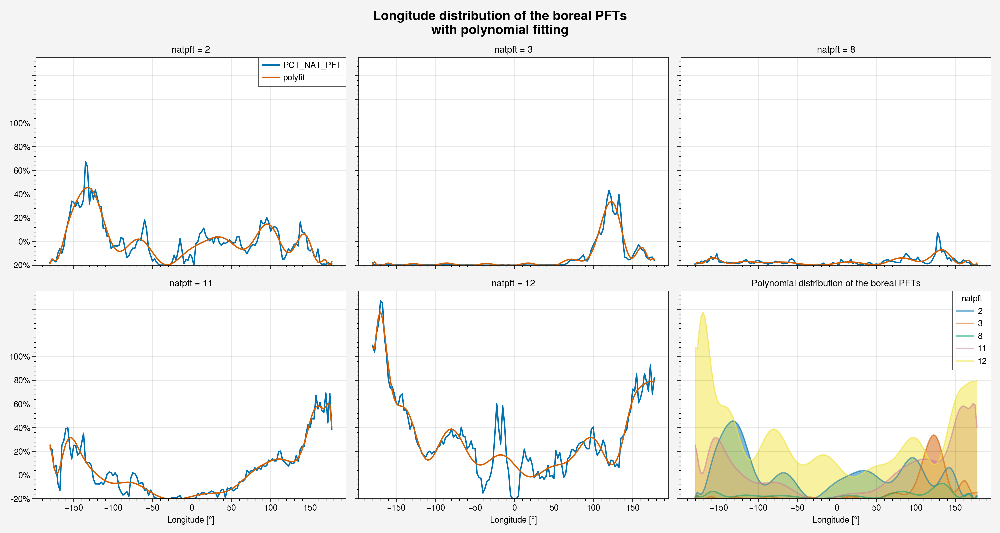

In [8]:
ds = boreal_pfts.copy()
ds_lon=ds.mean('lat').fillna(0.)
#ds_lon.plot(col='natpft', col_wrap=3)
#plt.show()

out = ds_lon.polyfit(dim="lon", deg=20, full=True)
polyfit = xr.polyval(coord=ds_lon.lon, coeffs=out.polyfit_coefficients).rename('polyfit')
#filter negative, irrealistic values
polyfit=polyfit.where(polyfit>0., 0.)
#polyfit.plot(col='natpft', col_wrap=3)
#plt.show()

ds_lon = xr.merge([ds_lon, polyfit.T])#.plot.line(x='lat',col='natpft', col_wrap=3) #.rename('rawdata')

lines = ['PCT_NAT_PFT','polyfit']

fig, axes = plt.subplots(2, 3, figsize=[15,8], sharex=True, sharey=True)
#fig.delaxes(axes.flatten()[5])

for b, ax in enumerate(axes.flat):
    if b == 5:
        #continue
        #ax.legend(handles=lines)
        #ax.set_visible(False)
        series = ds_lon['polyfit'].T.rename('').to_series().unstack()
        series.plot.area(ax=ax, stacked=False)
        #ax.plot(ds_lon.lon, ds_lon['polyfit'].T)
        ax.legend(boreal_pfts.natpft.values, title='natpft')
        ax.set_xlabel('Longitude [°]')
        ax.set_title("Polynomial distribution of the boreal PFTs")
    else:
        for l in lines:
            ax.plot(ds_lon.lon, ds_lon.isel(natpft= b)[l], label=l)
            #ax.set_ylim(0,90)
            ax.set_yticklabels(['{0:g}%'.format(x) for x in ax.get_yticks()])
            ax.set_title('natpft = '+str(boreal_pfts.natpft.values[b]))
            if b==3 or b==4:
                ax.set_xlabel('Longitude [°]')
            if b==0:
                ax.legend()

#fig.add_axes()
#axes.flat[-1].legend(lines)
#plt.legend(lines)
plt.suptitle('Longitude distribution of the boreal PFTs\nwith polynomial fitting', size=14)
plt.tight_layout()
plt.show()

In [9]:
# Here try to fix some biases of the polyfit (without managing)
#bor3 = ds_lon['polyfit'].sel(natpft=3).copy()
#ds_lon['polyfit'].sel(natpft=3).values = bor3.where(bor3.lon > 65., 0.)
#ds_lon['polyfit'].plot(col='natpft')

## 1b. Relative tree contribution to the total tree occurrence

In [10]:
# BOREAL NAT PDFs:

# - 2: NET Boreal
# - 3: NDT Boreal
# - 8: BDT Boreal
# ----= 15 Boreal Trees

# - 11: BDS Boreal
# - 12: artic C3 grass

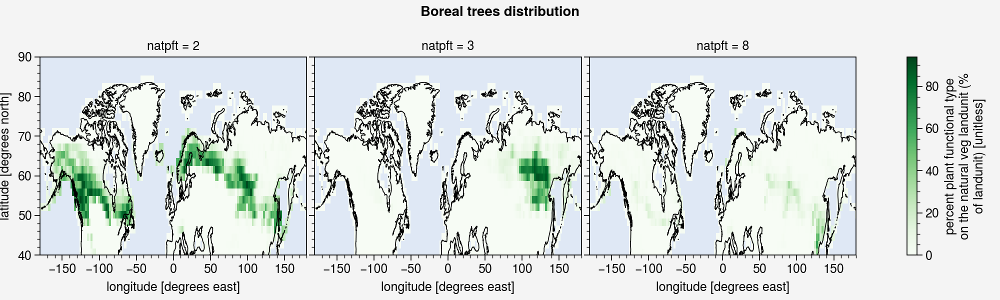

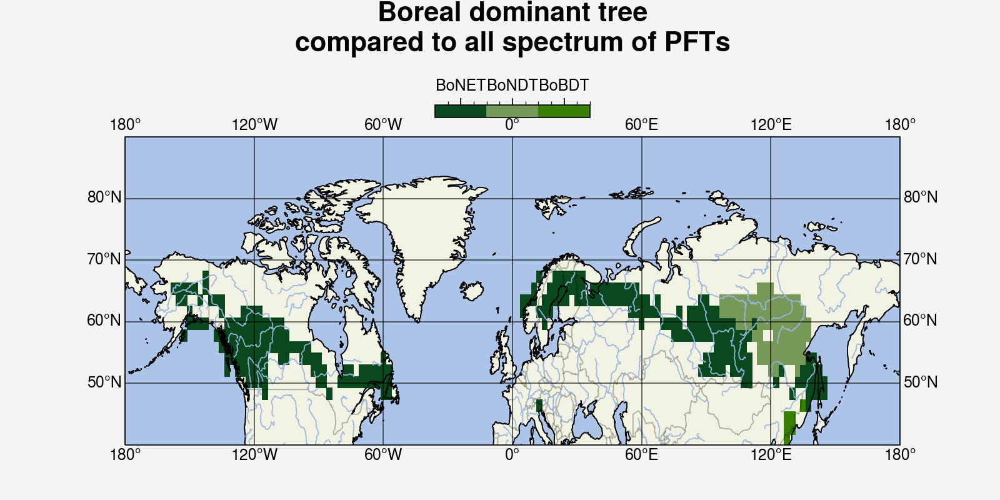

In [11]:
basic_pft_map(boreal_pfts.sel(natpft=[2,3,8]), title = "Boreal trees distribution")#, cmap='terrain_r')
col_dict={2:"pine green",3:"moss", 8:"dark grass green"}
labels = np.array(['BoNET','BoNDT','BoBDT'])
extent = [-180, 180, boreal_lat, 90]
plot_dominant_vegetation(pfts, "Boreal dominant tree\ncompared to all spectrum of PFTs", col_dict, labels, pft_list=[2,3,8], extent=extent, figsize=[8,4]) 

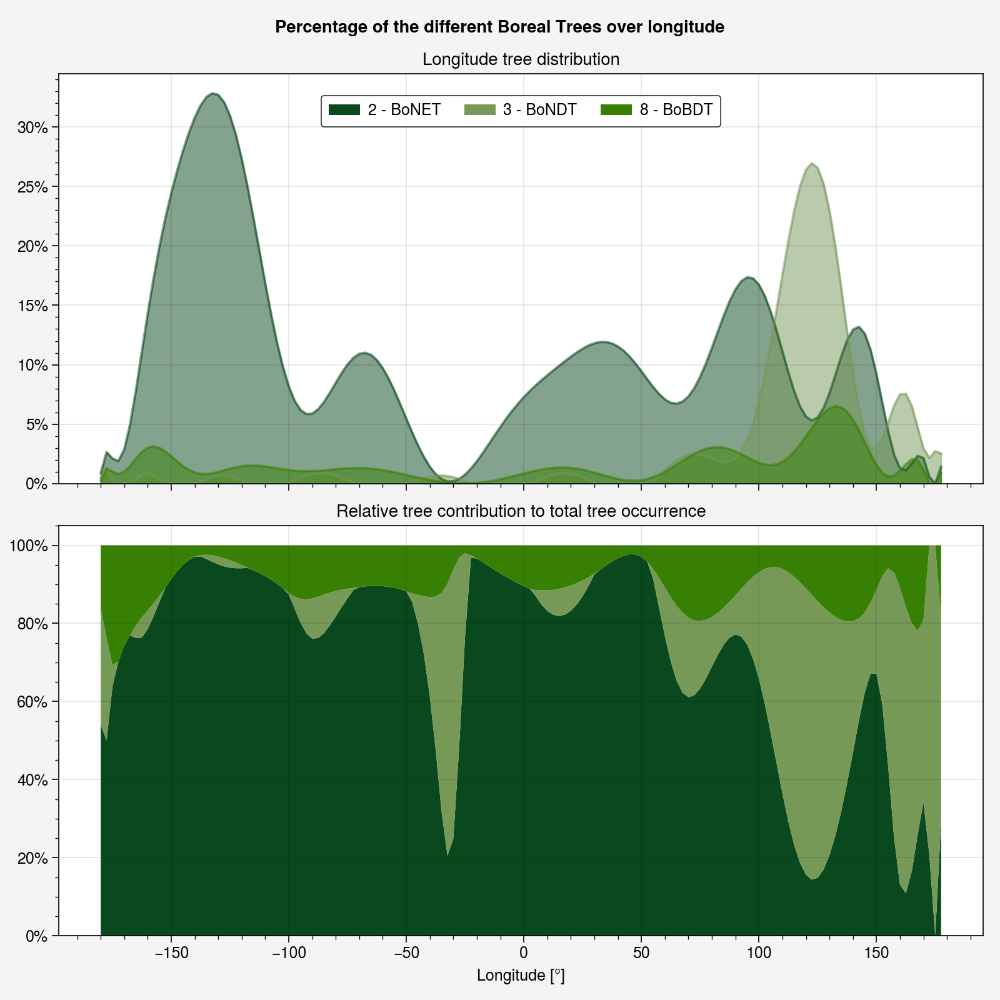

In [12]:
bt_colors = ["pine green","moss","dark grass green"]
legend = ['2 - BoNET', '3 - BoNDT', '8 - BoBDT']

fig, ax = plt.subplots(2,1, figsize=(8,8), sharex=True)

#### Longitude distribution of trees
series = ds_lon['polyfit'].sel(natpft=[2,3,8]).T.to_series().unstack() #series.plot.bar(ax=ax)#, stacked=True)
series.plot.area(ax=ax[0], stacked=False, color=bt_colors, legend = False, title = "Longitude tree distribution")

#### Relative contributions to the total tree occurrence
tree_lon_perc= ds_lon['polyfit'].sel(natpft=[2,3,8]).rename('')
tree_lon_perc=tree_lon_perc/tree_lon_perc.sum('natpft').values

ax[1].stackplot(tree_lon_perc.lon.values, (tree_lon_perc*100).values, colors=bt_colors)
ax[1].set_title("Relative tree contribution to total tree occurrence")

for a in ax.flatten():
    a.set_yticklabels(['{0:g}%'.format(x) for x in a.get_yticks()])
## Common legend
box = ax[1].get_position()
ax[1].set_position([box.x0, box.y0, box.width * 1, box.height*0.51])
plt.legend(legend, loc='upper center', bbox_to_anchor=[0.5,2.05],fancybox=True, ncol=3) #shadow=True,

plt.xlabel("Longitude [°]")
plt.suptitle("Percentage of the different Boreal Trees over longitude")
plt.tight_layout()
plt.savefig(fig_folder+'tree_distribution.png')
plt.show()

# 2. Latitude modulation of the replacement value

In [13]:
#### Check that land 0, ocean Nan
boreal_pfts = boreal_pfts.where(lnd_frac>0.)
#boreal_pfts.mean('lon').plot(y='lat', cmap='Greens'); plt.tight_layout(); plt.show()
#boreal_pfts.mean('lon').plot(y='lat', col='natpft'); plt.tight_layout(); plt.show()

## 2a. Overview on the latitude distribution 
### Lat distribution and the skew gaussian fit - compared with polynomial - to smooth the distribution

The gaussian fit works better in rendering the occurrence probability of the PFTs.

Note: There was a "hole" after lat=84.5 due to the fact that above that lat there is no land, but the gaussian was trunked so I filled the NaN values with 0 so that could be modelled also that part.

Gaussian fit has two improvements:

`gaussfit = gaussian_fit(ds = ds_lat, dim='lat', asym_gauss=True, fixed_extremes=True)`
- it can be asymmetric: "skew normal distribution" $\rightarrow$ fit better our distributions
- range limit/extreme values can be set to match the origianl ones.

Check the `dataset_manipulation.py` file to see the details.

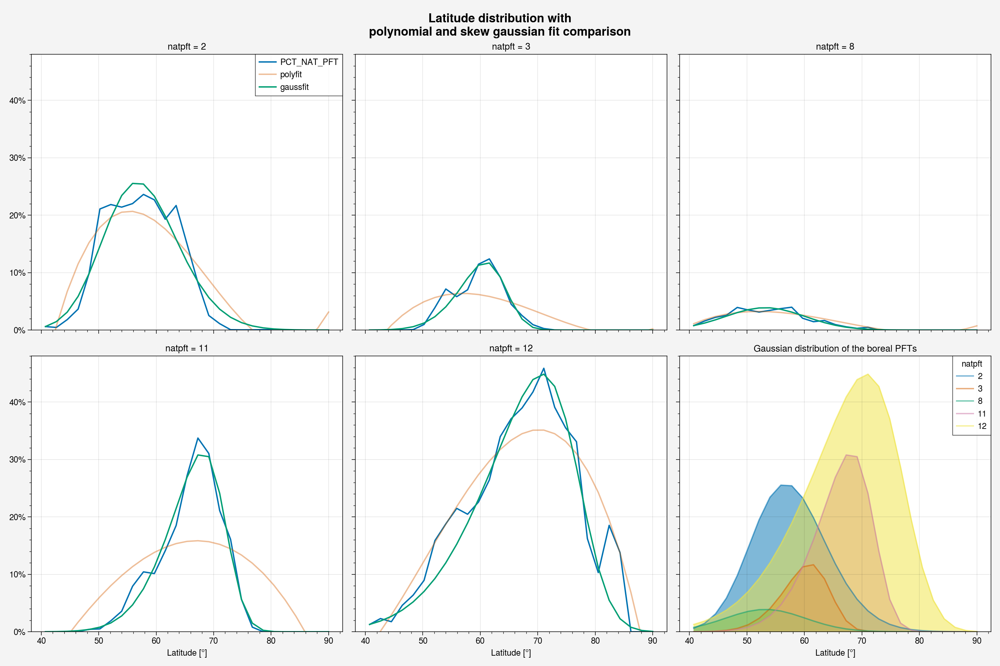

In [14]:
ds = boreal_pfts.copy()
ds_lat=ds.mean('lon').fillna(0.)#.dropna('lat', how='all')
# Problems with polyfit in dealing with NaN values

polyfit = polynomial_fit(ds = ds_lat, dim='lat', deg = 3)
gaussfit = gaussian_fit(ds = ds_lat, dim='lat', fixed_extremes=True, asym_gauss=True)

#polyfit.plot(y='lat', col='natpft', col_wrap=3); plt.suptitle("Polynomial fit"); plt.tight_layout(); plt.show()
#gaussfit.plot(y='lat',col='natpft', col_wrap=3); plt.suptitle("Gaussian fit"); plt.tight_layout(); plt.show()


################ PLOTTING ##################
ds_lat = xr.merge([ds_lat, polyfit.T, gaussfit.T])

lines = ['PCT_NAT_PFT','polyfit','gaussfit']
alphal = {'PCT_NAT_PFT': 1., 'polyfit': 0.4, 'gaussfit': 1.}

fig, axes = plt.subplots(2, 3, figsize=[15,10], sharex=True, sharey=True)

for b, ax in enumerate(axes.flat):
    if b == 5:
        series = ds_lat['gaussfit'].rename('').to_series().unstack()
        series.plot.area(ax=ax, stacked=False)
        ax.legend(boreal_pfts.natpft.values, title='natpft')
        ax.set_xlabel('Latitude [°]')
        ax.set_title("Gaussian distribution of the boreal PFTs")
    else:
        for l in lines:
            ax.plot(ds_lat.lat, ds_lat.isel(natpft= b)[l], label=l, alpha=alphal[l])
            ax.set_ylim(0,48)
            ax.set_yticklabels(['{0:g}%'.format(x) for x in ax.get_yticks()])
            ax.set_title('natpft = '+str(boreal_pfts.natpft.values[b]))
            if b==3 or b==4:
                ax.set_xlabel('Latitude [°]')
            if b==0:
                ax.legend()

plt.suptitle("Latitude distribution with\npolynomial and skew gaussian fit comparison", size="x-large", weight='bold')
plt.tight_layout()
plt.show()

The polyfit is not appropriate, also theoretically speaking, we are looking for a **latitude** probability distribution as a "bell" shape: with a peak and descending curves on the side.

Different is the point of the **longitude** where I need to see the avarage distribution in relation to longitude (e.g. related to land/ocean presence) $\rightarrow$ polyfit is simple but we are aiming to make a simple model.

## 2b. Aggregation of the boreal trees – natpft = 15
Let's gather trees $\rightarrow$ new `natpft=15` represents Boreal Trees 

**[2 - BoNET, 3 – BoNDT, 8 - BoBDT] = [15 – Boreal Trees]**

In [15]:
boreal_pfts_macro = tree_aggregation(boreal_pfts, tree_indexes=[2,3,8], tree_macro_index = 15, lnd_frac=lnd_frac)

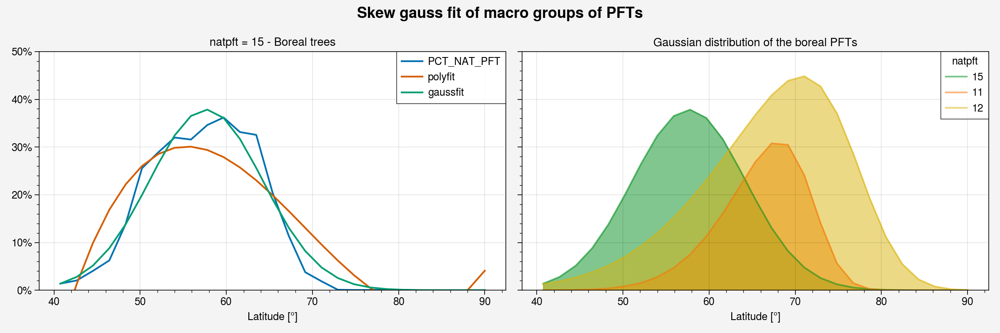

In [16]:
ds_lat_m=boreal_pfts_macro.mean('lon').fillna(0.) # Problems with polyfit in dealing with NaN values

polyfit_m = polynomial_fit(ds = ds_lat_m, dim='lat', deg = 3)
gaussfit_m = gaussian_fit(ds = ds_lat_m, dim='lat', asym_gauss=True, fixed_extremes=True)

#ds_lat_m.plot(y='lat', col='natpft'); plt.suptitle("Raw data"); plt.tight_layout(); plt.show()
#polyfit_m.plot(y='lat', col='natpft'); plt.suptitle("Polynomial fit"); plt.tight_layout(); plt.show()
#gaussfit_m.plot(y='lat',col='natpft'); plt.suptitle("Gaussian fit"); plt.tight_layout(); plt.show()

################ PLOTTING ##################
ds_lat_m = xr.merge([ds_lat_m, polyfit_m.T, gaussfit_m.T])
ds_lat_m['natpft']=ds_lat_m['natpft'].assign_attrs(boreal_pfts['natpft'].attrs)

lines = ['PCT_NAT_PFT','polyfit','gaussfit']
colors = ['emerald green', 'orange', 'gold']
legend = {15:'15 - Boreal trees', 11:'11 - Boreal schrubs', 12:'12 - arctic C3 grass'}

fig, axes = plt.subplots(1, 2, figsize=[12,4], sharex=True, sharey=True)

for b, ax in enumerate(axes.flat):
    if b == 0:
        for l in lines:
            ax.plot(ds_lat_m.lat, ds_lat_m.sel(natpft=15)[l], label=l)
            ax.set_ylim(0,90)
            ax.set_title('natpft = 15 - Boreal trees')
            ax.legend()
    else:
        series = ds_lat_m['gaussfit'].rename('').to_series().unstack()
        series.plot.area(ax=ax, stacked=False, color=colors)
        ax.legend(legend, title='natpft')
        ax.set_title("Gaussian distribution of the boreal PFTs")
    ax.set_ylim(0,50)
    ax.set_yticklabels(['{0:g}%'.format(x) for x in ax.get_yticks()])
    ax.set_xlabel('Latitude [°]')

plt.suptitle("Skew gauss fit of macro groups of PFTs", size="x-large", weight='bold')
plt.tight_layout()
plt.show()

### Macro PFTs = [15 – Boreal trees, 11 – Boreal shrubs, 12 – arctic C3 grass]

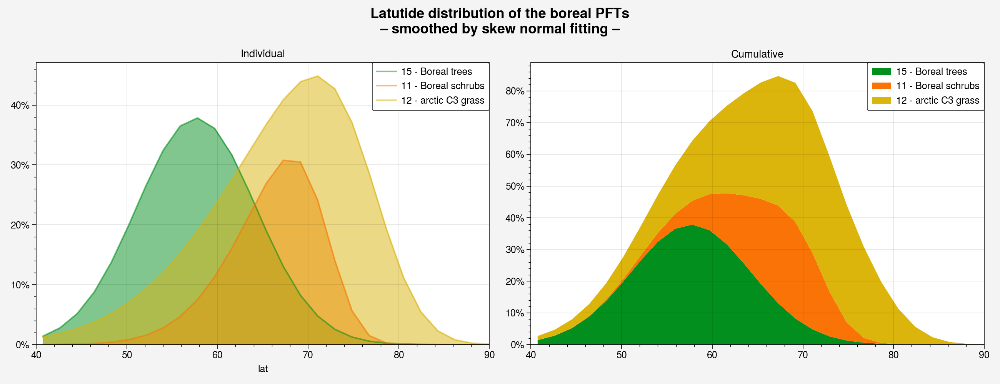

In [17]:
plot_individual_cumulative(ds_x = ds_lat_m.lat, ds_y = ds_lat_m.gaussfit.rename(''), 
                           title = "Latutide distribution of the boreal PFTs\n– smoothed by skew normal fitting –", 
                           col=colors, legend=legend.values(), figname=fig_folder+'lat_distribution.png')

## 2c. Replacement curves

**NOTE**: easier to look at the plots than to read it in words.

### 1) Apply the shift on latitude
**+ select below 90 deg (after shift above 90°) + interpolation to match coordinates among DataArrays**

Problem: The lat coordinates did not correspond after the imposed shift $\rightarrow$ interpolate with quadratic method to match lat and fill nan values interpolationg again + forcing the extremes to 0 (otherwise it does not work).

### 2) Normalization: from lat distribution to proxy for the percentage of replacement

The lat distributions can span in all the range $[0\%,100\%]$ (see plot just above), we want now to have a replacement curve, so that has $min=0\%$ and $max=norm\_factor=50\%$

### 3) Replacement: trees $\rightarrow$ shrubs; shrubs $\rightarrow$  grass (rolling `lat_replacem`)

In order to apply the replacement: the curve of the tree needs to be apply to the shrubs, and so for shrubs over grass. So we roll the dataset by one.

**NOTE:** this is not the perfect way to do it: then grass is in natpft of trees. But just remember to drop it later!

### 4) Final replacement: keep just high latitude curve
The idea of the replacement is just to keep the high-latitude descent, not the one that goes to the lower latitudes. This will be substituted by an uniform distribution = norm_factor.

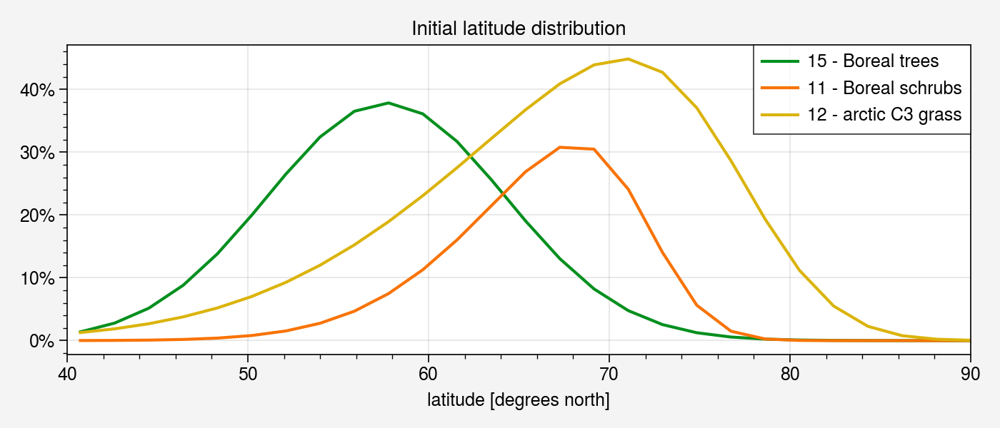

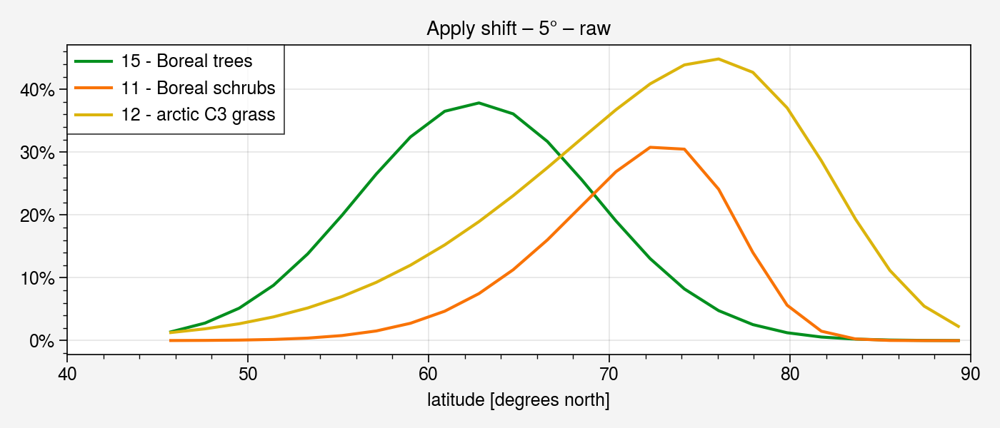

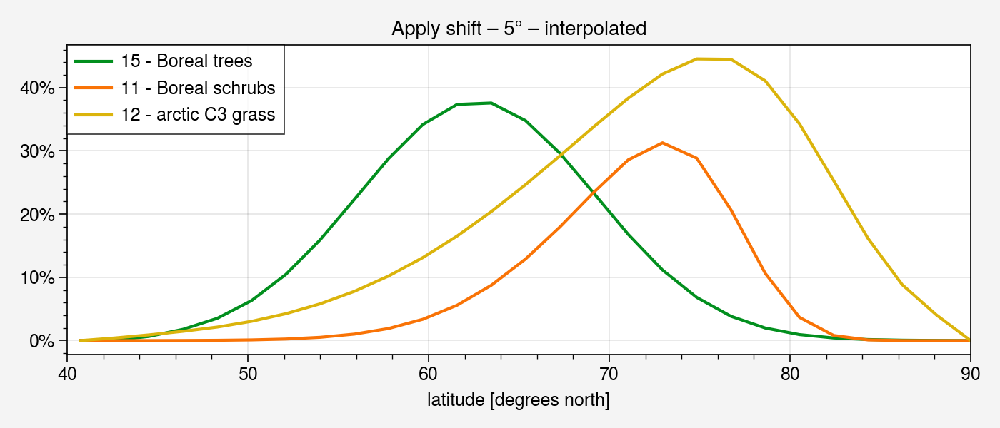

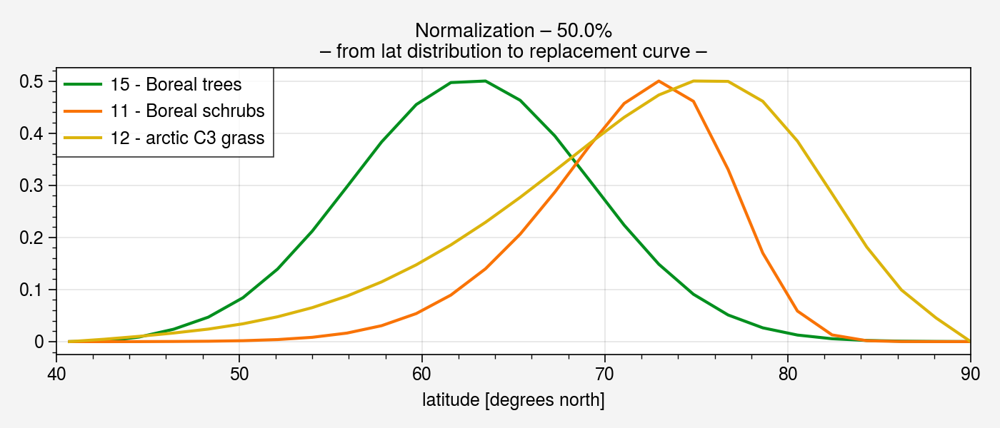

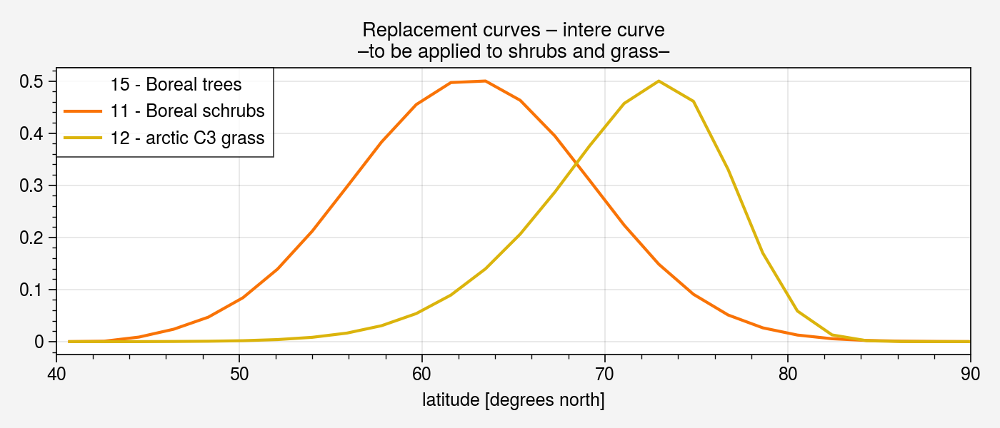

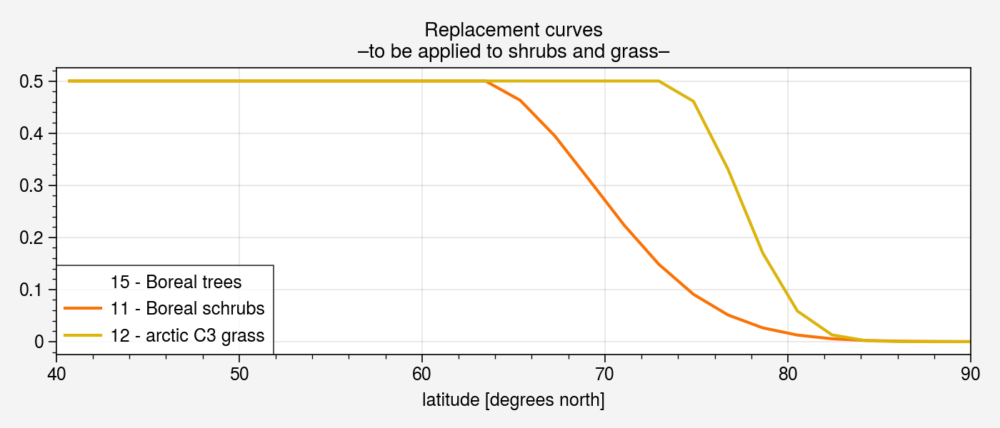

In [18]:
#### 0) INITIAL CURVES
lat_distribution_m = ds_lat_m.gaussfit.rename('')
basic_line_plot(lat_distribution_m, "Initial latitude distribution", colors=colors)

#### 1) SHIFT 
#shift=shift
lat_replacem=ds_lat_m.gaussfit.rename('').copy()
lat_replacem=lat_replacem.assign_coords({'lat': lat_replacem.lat+shift})
lat_replacem['lat']=lat_replacem['lat'].assign_attrs(boreal_pfts['lat'].attrs) #keep attributes
#filter if the shift is too high
lat_replacem=lat_replacem.where(lat_replacem.lat<=90.).dropna('lat', how='all')
#plot_individual_cumulative(ds_x = lat_shift_perc.lat, ds_y = lat_shift_perc, title = "Percentage to apply in the substitution [before normalization]", col=colors, legend=legend.values())
basic_line_plot(lat_replacem, "Apply shift – "+str(int(shift))+"° – raw", colors=colors)

#### 3) FIX COORDINATE BIAS
da = lat_replacem.interp(lat=boreal_pfts_macro['lat'], method='quadratic')
da[0]=0.; da[-1]=0.
lat_replacem = da.interpolate_na(dim='lat', method='quadratic')
basic_line_plot(lat_replacem, "Apply shift – "+str(int(shift))+"° – interpolated", colors=colors)

#### 2) NORMALISATION
#norm_factor=norm_factor
lat_replacem = lat_replacem/lat_replacem.max(dim='lat')*norm_factor
lat_distr_norm = lat_replacem
basic_line_plot(lat_replacem, "Normalization – "+str(norm_factor*100)+"%\n– from lat distribution to replacement curve –", colors=colors, ytick_perc=False)

#### 4) REPLACEMENT ROLL
lat_replacem = lat_replacem.roll(natpft=1)
#lat_replacem.plot(col='natpft')
basic_line_plot(lat_replacem, "Replacement curves – intere curve\n–to be applied to shrubs and grass–", alpha=[0,1,1], colors=colors, ytick_perc=False)

#### 5) KEEP JUST NORTHWARD DECENT
lat_max = lat_replacem.where(lat_replacem == lat_replacem.max('lat')).dropna('lat', how='all')['lat']
val_max = lat_replacem.max('lat')

for i in [0,1,2]:
    natpft_list=np.sort(lat_replacem.natpft.values)
    n = natpft_list[i]
    lat_replacem.loc[dict(natpft=n)] = lat_replacem.sel(natpft=n).where(lat_replacem.lat > lat_max[i], val_max[i])

basic_line_plot(lat_replacem, "Replacement curves\n–to be applied to shrubs and grass–", alpha=[0,1,1], colors=colors, ytick_perc=False)

## For a better understanding of the replacement curve idea
- *uniform curve*: applying this we would get a uniform replacement in all latitudes (50% replacement of trees over shrubs at all latitudes) - little realistic
- *normalized distributions*: first step to have smooth descent of the replacement percentage over latitude - the lower latitude descent is not realistic in replacement (why should it decrease going south when the shift is northward?)
- *replacement curves*: functions to apply to a 2D lon-lat distribution of the *"macro PFTs" (boreal trees, boreal shrubs, artic C3 grass).*

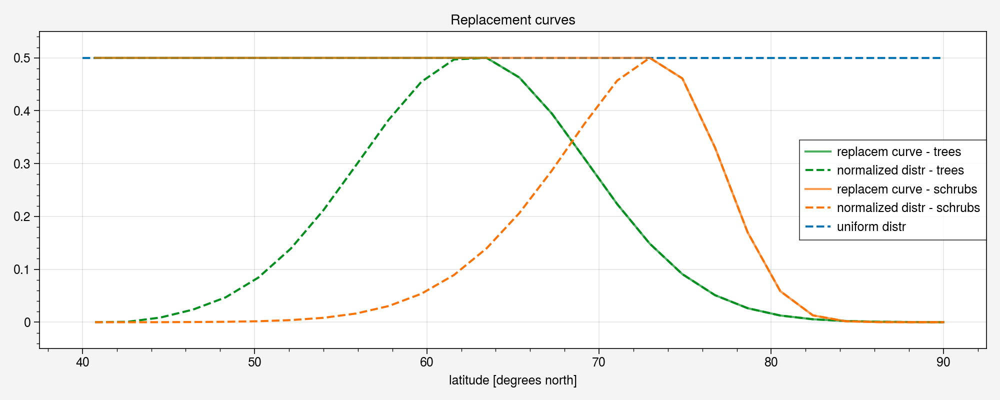

In [19]:
############## PLOT TO UNDERSTAND THE IDEA ###################
lat_modulation = lat_replacem.roll(natpft=-1)
leg = {15:' - trees', 11:' - schrubs', 12:' - grass'}


fig, ax = plt.subplots(figsize=[10,4])
for i, n in enumerate(lat_modulation.natpft.values):
    if n!=12:
        lat_modulation.sel(natpft=n).plot(ax=ax, label="replacem curve"+leg[n], color=colors[i], alpha=0.7)
        lat_distr_norm.sel(natpft=n).plot(ax=ax, label="normalized distr"+leg[n], color=colors[i], linestyle='--')

plt.hlines(y=0.5, xmin=40, xmax=90, linestyle='dashed', label="uniform distr")
ax.set_ylim(-0.05,0.55)
plt.legend(loc='right')#loc='right',bbox_to_anchor=(0.97, 0.5))
plt.title("Replacement curves")
plt.tight_layout()
plt.savefig(fig_folder+'replacement_curves.png')
plt.show()

### <div class="alert alert-info">Comments:</div>
- **Problems with ccrs.PlateCarree**:
    1. Problem with projections that the **subplots do not fill the whole figure** anymore. If `col_wrap=None`: `ax.set_position([0.04+i*(1/5+0.01), 0.15, 1/5, 0.65])` for 5 subplots. Then add `add_colorbar=False` in `da.plot()` and at the end `p.add_colorbar()`
    2. Also it solves the problem that it does **not fit correctly the title**.
    3. It does **not show the axis ticks and labels**: `ax.set_xticks(ax.get_xticks()[abs(ax.get_xticks())<=180])
            ax.set_yticks(ax.get_yticks()[abs(ax.get_yticks())<=90])`
    4. always remember: `ax.set_aspect('auto')`
- **Add a coordinate value** to Xarray DataArray: `assign_coords()` + `expand_dims()` -> `xr.concat()` (that needs to have dimension along which concatenate and the two datasets in a tuple () - round brakets)

`da = da.assign_coords({"natpft":15}).expand_dims('natpft')
boreal_pfts_macro = xr.concat((da, ds), dim='natpft')`

- **Reorder of a coordinate values**: `ds.sel(dim=[new order])`
- *How do I by Xarray*: https://docs.xarray.dev/en/stable/howdoi.html
- **Get the legend** from an existing legend: `get_legend()` and then [need to access the `Legend` type](https://stackoverflow.com/questions/44465242/getting-the-legend-label-for-a-line-in-matplotlib). It's made of [Artist](https://matplotlib.org/stable/api/artist_api.html#matplotlib.artist.Artist).
- **Inline for loop**: https://stackoverflow.com/questions/27411631/inline-for-loop
- **Fixed extremes in fitting** or **force fitting through specific values**: `sigma` parameter in `curve_fit()` is what you are looking for! It tells the function with which precision it needs to be fitted, an array refering to each value. [Here](https://stackoverflow.com/questions/33539287/how-to-force-specific-points-in-curve-fitting) is the example how to use it. [Here is polynomial fit](https://stackoverflow.com/questions/15191088/how-to-do-a-polynomial-fit-with-fixed-points).
- When documentation says `**kwargs`, the you need to pass: `kwarg=dict()`.
- For `param_names` a useful cose is: 
`n_peaks=2; names = ["alpha", "beta"]; names = [f"{name}{i}" for i in range(n_peaks) for name in names]`
- **Add element to dictionary**: `dict_name['new_key']= new_item`
- **Asymmetric gaussian / skew nromal distribution**: it deals with the ERF function. Some references [here]() and [here](https://stackoverflow.com/questions/5884768/skew-normal-distribution-in-scipy)
- The gaussian fit doesn'r work without 'p0' (guessed parameters)
- **Print True-False list/array for finding elements in list/array**: `np.isin(arr1, arr2)`

For array: `arr1= np.array(['b', 'a'])
arr2= np.array(['a', 'b', 'foo', 'bar'])
result = np.isin(arr2, arr1)`

For list:
`[x in ['b', 'a'] for x in ['a', 'b', 'foo', 'bar']]`

- **Pass DataArray as optional argument in function**: `lnd_frac=xr.DataArray(None))` $\rightarrow$ `if lnd_frac.any(): dt = dt.where(lnd_frac>0.)` 

In [20]:
#boreal_trees = boreal_pfts.isel(natpft=[0,1,2]).sum('natpft')
#boreal_trees.mean('lon').plot(y='lat'); plt.tight_layout(); plt.show()
#boreal_shrubs = boreal_pfts.sel(natpft=11)
#boreal_grass = boreal_pfts.sel(natpft=12)

# 3. Apply replacement curve

Rule:
- Trees -> shrubs: [2,3,4] -> [11]
- Shrubs -> grass: [11] -> [12]
- NO: - grass -> bg or temperate -> boreal

### Steps:
0. Initial configuration: `boreal_pfts_m`
1. Extract latitude for each grid cell (over the boreal_lat) and find the correspondent perc for the replacement in `lat_replacem`, for each PFT [15,11,12] -> evaluate the overall replacement (`presence_perc * lat_replacem = replecement_perc`)
2. The `replecement_perc` data is then subtracted by the [11,12] and added to [15,11]
3. Check normalisation.

### 0. Initial configuration: `boreal_pfts_m`

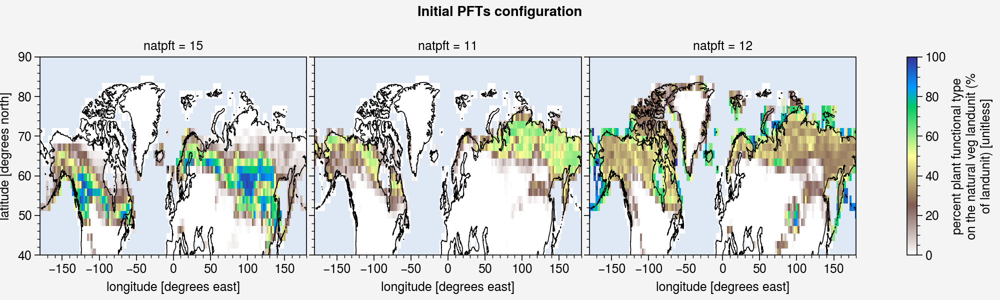

In [21]:
basic_pft_map(boreal_pfts_macro, title = "Initial PFTs configuration", cmap='terrain_r')

### 1. Evaluate the overall replacement (`replecement_perc`)
`replecement_perc = presence_perc * lat_replacem`

**Extract latitude for each grid cell (over the boreal_lat) and find the correspondent perc for the replacement in `lat_replecem`, for each PFT [15,11,12].**

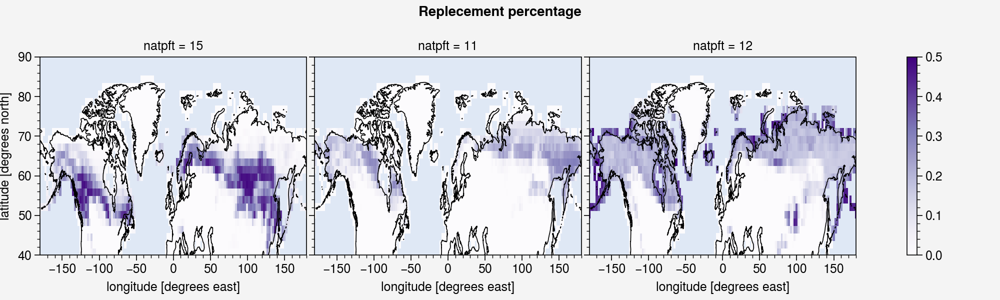

In [22]:
replecement_perc = xr_prod_along_dim(boreal_pfts_macro, lat_replacem, 'lat')/100.
basic_pft_map(replecement_perc, title = "Replecement percentage", cmap='purples')

### Testing the operation of multiplication along axis

In [23]:
for la in range(len(boreal_pfts_macro.lat.values)):
    for lo in range(len(boreal_pfts_macro.lon.values)):
        for na in range(len(boreal_pfts_macro.natpft.values)):
            a = boreal_pfts_macro.isel(lat=la, lon=lo, natpft=na).values
            b = lat_replacem.isel(lat=la, natpft=na).values
            c = a*b/100.
            d = replecement_perc.isel(lat=la, lon=lo, natpft=na).values
            np.testing.assert_equal(c, d)
print("Test on replecement done √")

Test on replecement done √


### 2. The `replecement_perc` data is then subtracted by the [11,12] and added to [15,11]

Operations:
1. Evaluate the ammount to subtract to shrubs+grass and to add to trees+shrubs: `diff = config_init * replecement_perc`
2. Apply the difference to shrubs and grass: `subtracted = config_init - diff`
3. Apply the sum to trees and shrubs: `edited_config = subtracted+add` where `add = diff.roll(natpft=-1)`

See `modify_surfdatamap.py` for further details.

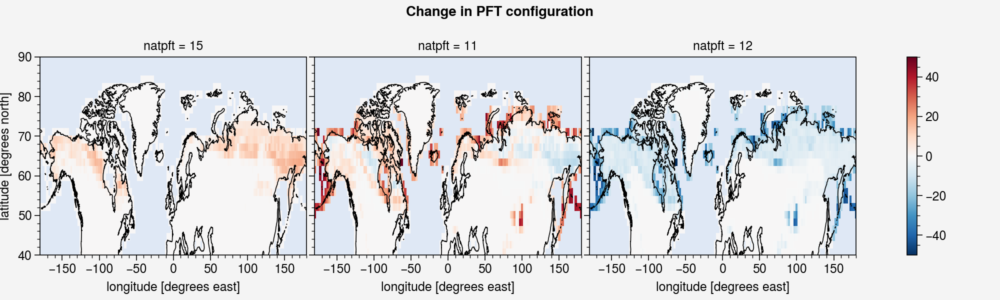

In [24]:
edited_macro = apply_replacement_perc(boreal_pfts_macro, replecement_perc, lnd_frac=lnd_frac)
change = edited_macro-boreal_pfts_macro
basic_pft_map(change, title = "Change in PFT configuration", cmap='burd')

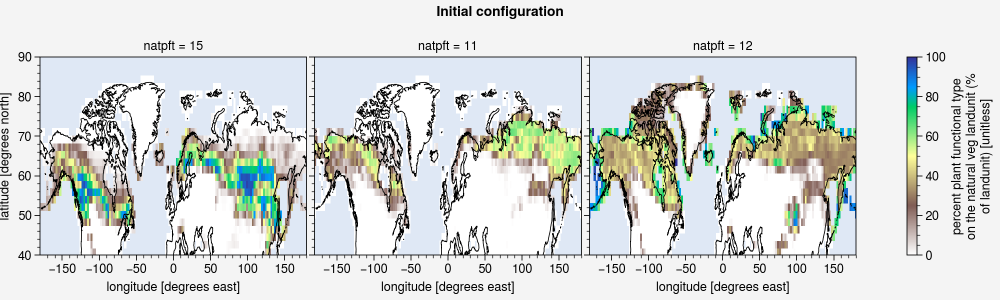

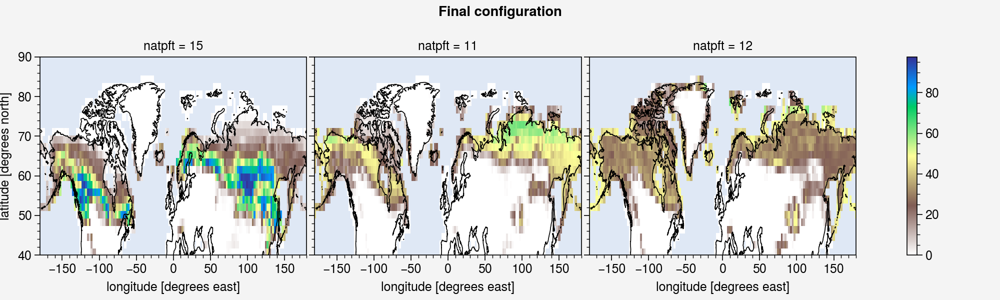

In [25]:
basic_pft_map(boreal_pfts_macro, title = "Initial configuration", cmap='terrain_r')
basic_pft_map(edited_macro, title = "Final configuration", cmap='terrain_r')

### 3. Separation within tree PFTs

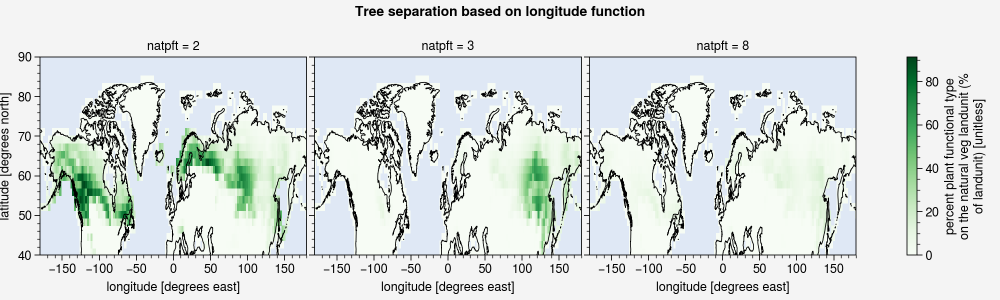

In [26]:
edited_config = tree_separation(edited_macro, tree_lon_perc, xr_prod_along_dim, attrs= boreal_pfts.attrs)
basic_pft_map(edited_config.sel(natpft=[2,3,8]), title = "Tree separation based on longitude function")

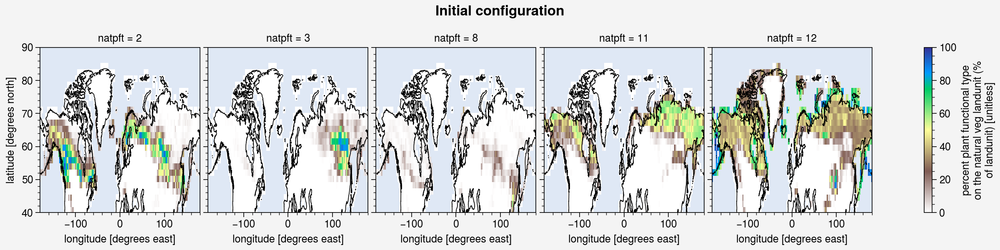

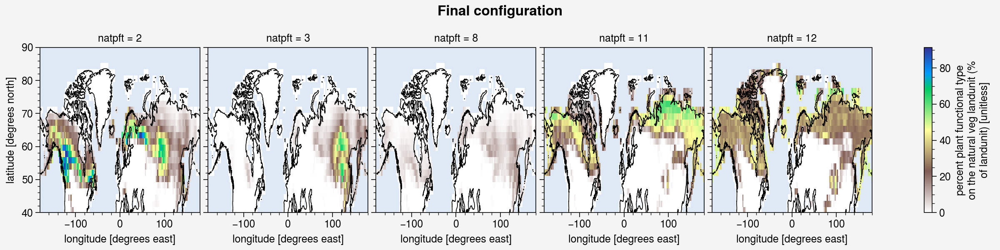

In [27]:
basic_pft_map(boreal_pfts, title = "Initial configuration", figsize=(12,3), cmap='terrain_r')
basic_pft_map(edited_config, title = "Final configuration", figsize=(12,3), cmap='terrain_r')

### 4. Final beautiful plots (like dominant veg)

In [28]:
#plot_boreal_pfts(wow-boreal_pfts)

### 5. Modify the original file

Allert convert_to_lsmcoord! Changing from coord to dim means loosing information and changing from values to indexes


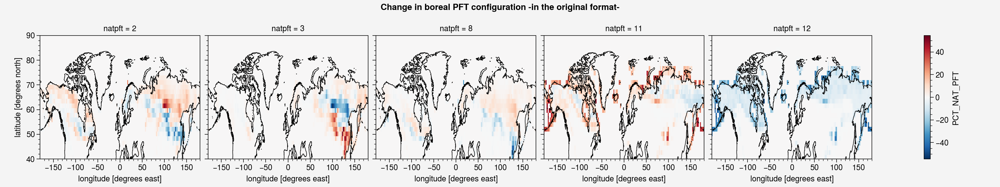

In [29]:
# Import original file
dset_in = xr.open_dataset(fn)
# Apply modification to the original surfdata map
ds = surfdatamap_modification(original_ds = dset_in, pfts_tot = pfts, edited_pfts = edited_config)
# Save the new edited surfdatafile
ds.load().to_netcdf(folder_out+'IDEALIZED/'+fn_in+'_edited.nc')
# Plot difference
#a = dset_in.PCT_NAT_PFT.sel(natpft=[2,3,8,11,12]); a.plot(col='natpft'); plt.show()
#b = ds.PCT_NAT_PFT.sel(natpft=[2,3,8,11,12]); b.plot(col='natpft'); plt.show()
#c= (b-a)#;c.plot(col='natpft', col_wrap=3); plt.show()
d = convert180_360(convert_lsmcoord(dset_in)).PCT_NAT_PFT.sel(natpft=[2,3,8,11,12])
e = convert180_360(convert_lsmcoord(ds)).PCT_NAT_PFT.sel(natpft=[2,3,8,11,12])
basic_pft_map((e-d), title ="Change in boreal PFT configuration -in the original format-", cmap='burd')

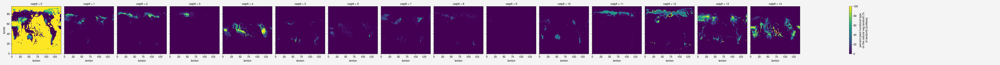

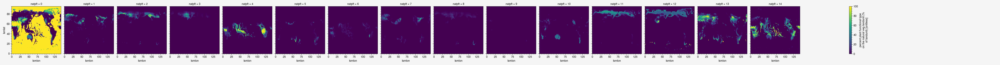

In [30]:
dset_in.PCT_NAT_PFT.plot(col='natpft')
ds.PCT_NAT_PFT.plot(col='natpft')

### <div class="alert alert-info">Comments:</div>
- **Product/multiplication along a specific dimension**: I wished to have `xr.prod(ds1,ds2, dim)`, but it doesn't exit. Then I found a solution [here](https://www.reddit.com/r/learnpython/comments/g45f2u/multiplying_xarray_dataarrays/).
- **If two datasets** are needed to work together, but **not corresponding dimension values**: `xr.interp()`.
- **OBS!** in order to use `xr.interpolate_na()` you need to have the extreme values set.
- **Assigning values**: 
    - --> `da.isel()` doesn't work for assigning, but just calling.
    - **by `.loc[dic()]`**: `da.loc[dict(lon=260, lat=30)] = 100`. Be careful for the syntax with`[]`.
    - **by `where()`**: `ds = xr.where((ds["lat"] == 20) & (ds["lon"] == 260), 100, ds)
    - **by indexes**: `da[0] = -1  # assignment with broadcasting`. See [here](https://docs.xarray.dev/en/stable/user-guide/indexing.html#assigning-values-with-indexing) for further details.
- **OBS!** difference in arguments for `xr.where(cond, x if True, y if False)` and `da.where(cond, y if False)`
- **Assert with nan values**: `numpy.isclose(v1, v2, equal_nan=True)`. [Here](https://stackoverflow.com/questions/51728427/unittest-how-to-assert-if-the-two-possibly-nan-values-are-equal) further options.

### Some notes on the way:
**Polynomial fit**: *[I filter over lat >10 deg, outside the boreal zone
**OBS!** 'dropna' and 'fillna' are very important to render well the fitting in the target lat range - outside the range the polynomial gives wierd shapes.
But 'dropna' needs to be specify how=all, because otherwise extra rows are dropped, if there is just 1! NaN values!]* --> this was important before having already imported the datset over lat > 40

*Note*: I tried to implement the polynomial fit with fix extreme values as well, but after so many attempts I gave up, because I don't need it.

**Shit and gaussian fit**: *[This led to not a smooth curve --> I tried to fix the extremes of the fitting, but the sigma parameter is not supported by curvefit of Xarray. Also I should be careful with the shifting afterwards]*

**Replacement rule**: 
1. you need to broadcast lat and lon 
2. apply to shrub perc -> substract to shrubs and add to trees..etc
3. check normalization



## <div class="alert alert-success">Appendix A: change in treecover</div>
Since the disgregation is over longitude, the final configuration doesn't preserve the latitude dependence and the original pattern. The difference between the two configurations can look unexpected and incorrect, but if our focus is over the BVOC production, the disgragation doen't need to be as precise.

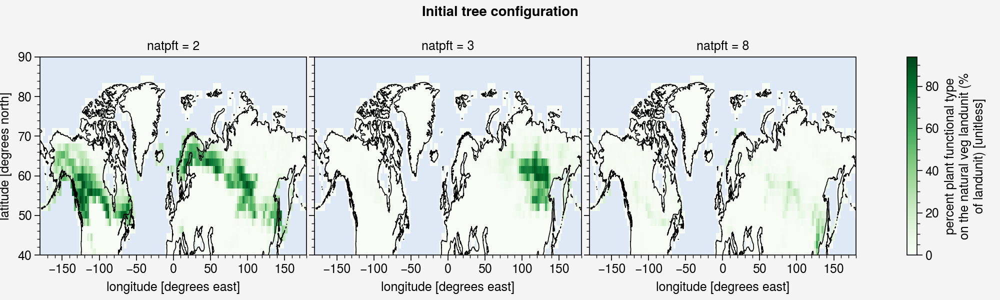

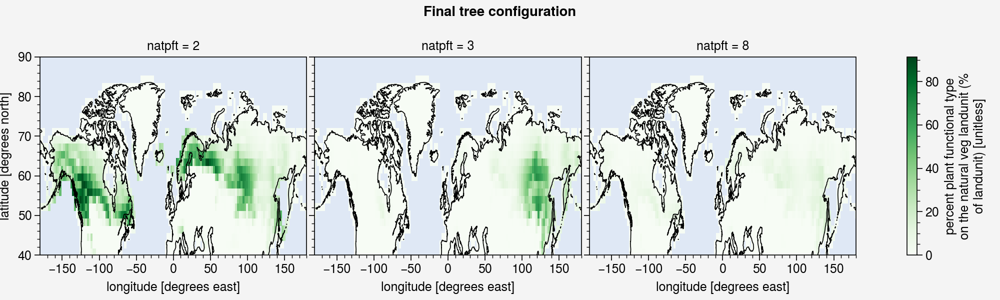

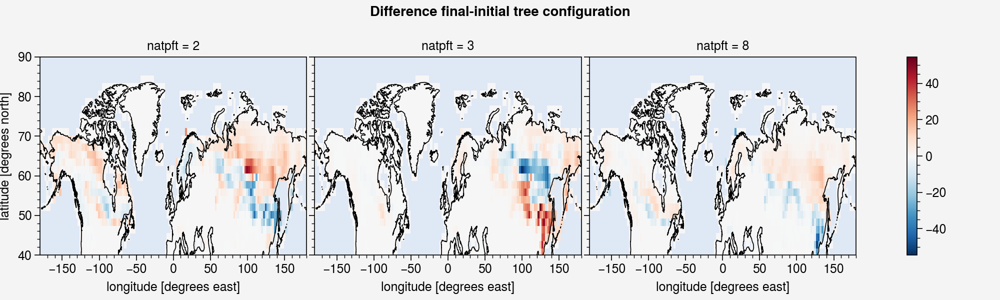

In [31]:
init_trees = boreal_pfts.sel(natpft=[2,3,8])
fin_trees = edited_config.sel(natpft=[2,3,8])
basic_pft_map(init_trees, title = "Initial tree configuration")
basic_pft_map(fin_trees, title = "Final tree configuration")
basic_pft_map((fin_trees-init_trees), title = "Difference final-initial tree configuration", cmap='burd')

## <div class="alert alert-success">Appendix B: dominant vegetation visualisation</div>


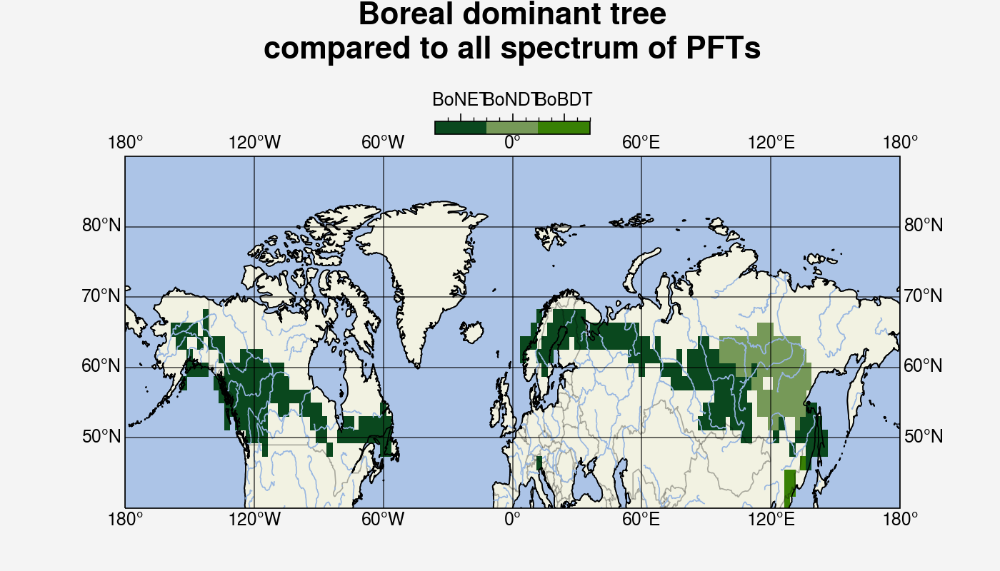

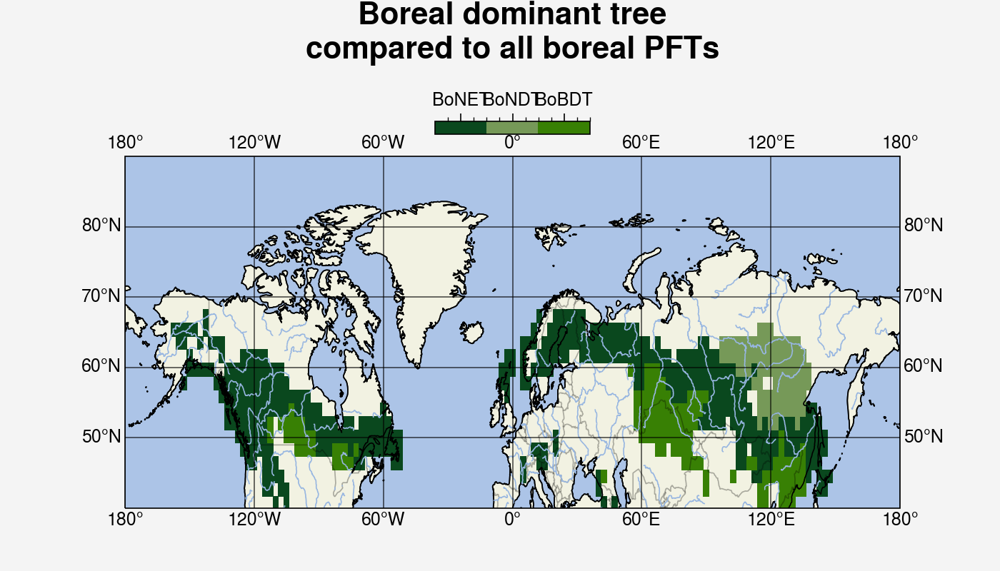

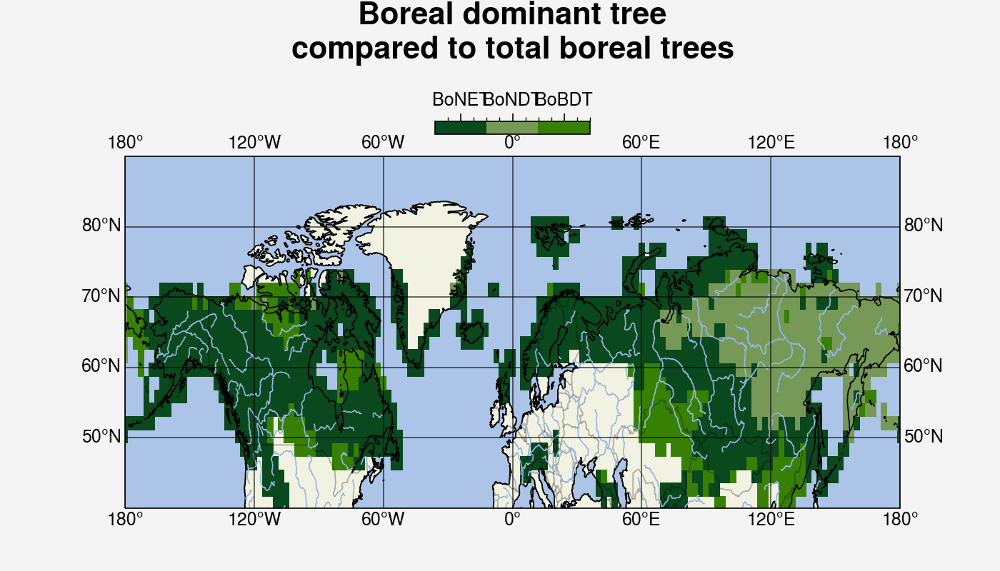

In [32]:
col_dict={2:"pine green",3:"moss", 8:"dark grass green"}
labels = np.array(['BoNET','BoNDT','BoBDT'])
proj=ccrs.Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]
plot_dominant_vegetation(pfts, "Boreal dominant tree\ncompared to all spectrum of PFTs", col_dict, labels, pft_list=[2,3,8], extent=extent, figsize=[7,4]) 
plot_dominant_vegetation(boreal_pfts, "Boreal dominant tree\ncompared to all boreal PFTs", col_dict, labels, pft_list=[2,3,8], extent=extent, figsize=[7,4]) 
plot_dominant_vegetation(boreal_pfts.sel(natpft=[2,3,8]), "Boreal dominant tree\ncompared to total boreal trees", col_dict, labels, extent=extent, figsize=[7,4])

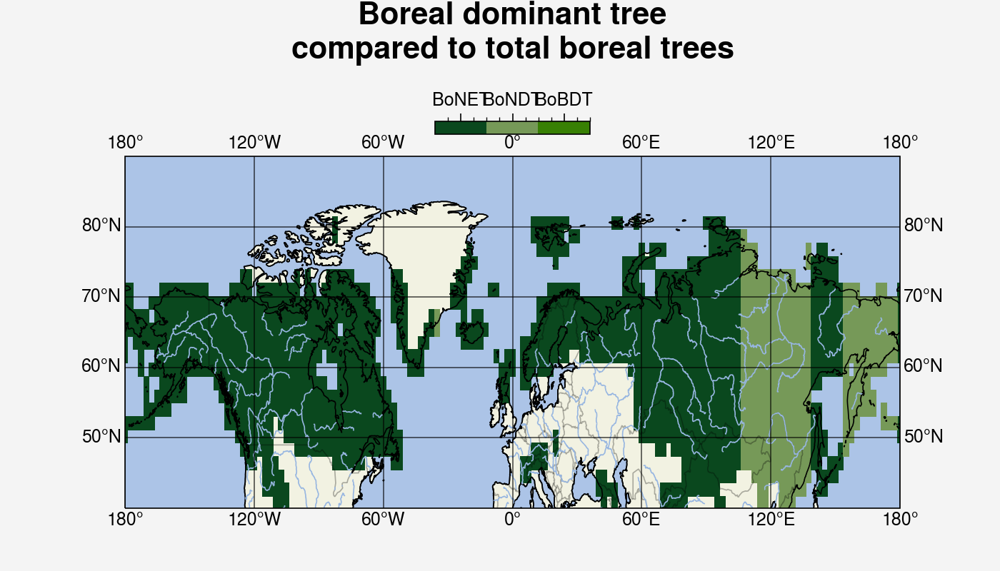

In [33]:
plot_dominant_vegetation(edited_config.sel(natpft=[2,3,8]), "Boreal dominant tree\ncompared to total boreal trees", col_dict, labels, pft_list=[2,3,8], extent=extent, figsize=[7,4]) 

### WIP: dominant vegetation visualisation with respective occurance value

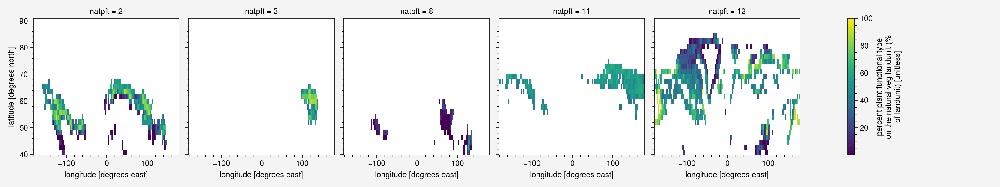

In [34]:
### START BUILDING THE VARIOUS COMPONENTS
pfts_list = list(boreal_pfts.natpft.values)

dom_veg = boreal_pfts.copy()
#dom_veg.plot()
pfts_max = boreal_pfts.max(dim='natpft')
pfts_max=pfts_max.where(pfts_max>0.)
#pfts_max.plot()

for p in pfts_list:
        pft_filter=boreal_pfts.sel(natpft=p) == pfts_max#; pft_filter.plot(); plt.show()
        dom_veg.loc[dict(natpft=p)] = dom_veg.sel(natpft=p).where(pft_filter)
        
dom_veg.plot(col='natpft')

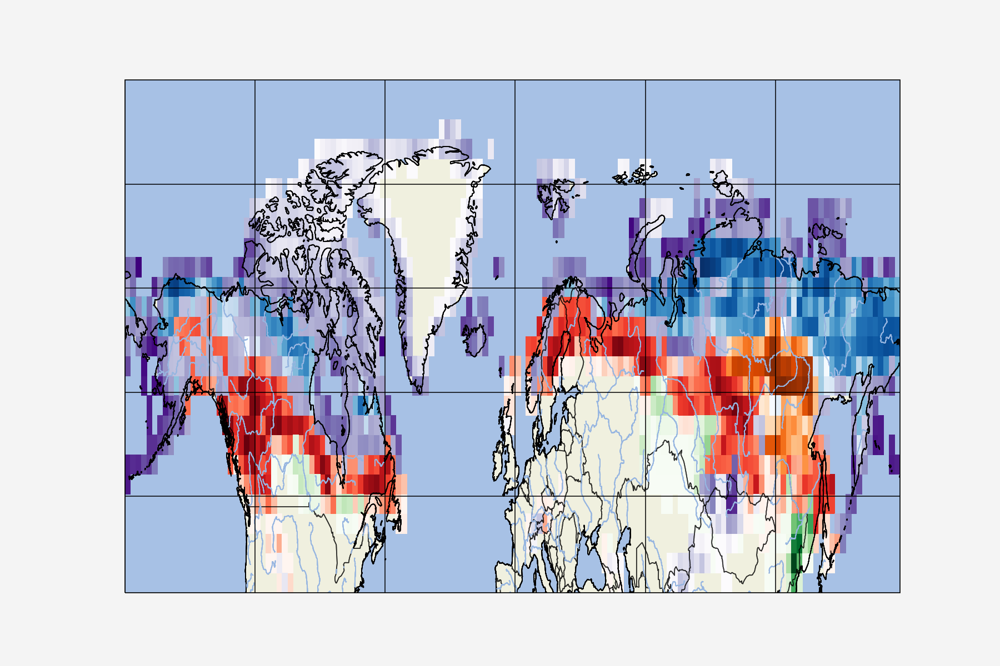

In [35]:
### THE PROBLEM HERE: WHICH PALETTE TO CHOOSE? AD HOC PALETTE. THEN PROBLEM WITH LEGEND? (plt.colorbar...)
x = boreal_pfts['lon'].values
y = boreal_pfts['lat'].values
X, Y = np.meshgrid(x, y)
cmap=['reds', 'oranges', 'Greens', 'blues','purples']
fig = plt.figure(1, figsize=[9,6])#,dpi=100)
ax = plt.axes(projection=ccrs.PlateCarree())
#alpha=[1,0.8,0.5]
for i, n in enumerate([2,3,8,11,12]):
    Z = dom_veg.sel(natpft=n).values
    #Z = Z.where(Z>0).values
    plt.pcolor(X,Y,Z, cmap=cmap[i])#, levels=1000)#pcolormesh
    ax_map_properties(ax)
    ax.set_aspect('auto')
    #plt.colorbar()

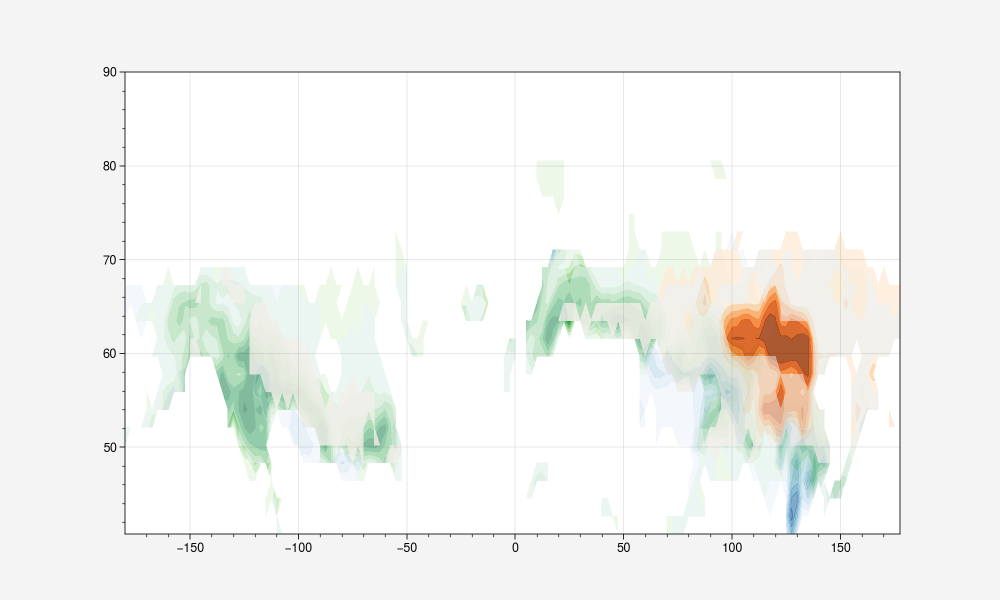

In [36]:
### THE PROBLEM HERE: EVERY LAYER OVERLAPS THE PREVIOUS AND MAKES IT LIGHTER (MISLEADING INFO THEN)

x = boreal_pfts['lon'].values
y = boreal_pfts['lat'].values
X, Y = np.meshgrid(x, y)
cmap=['Greens', 'oranges', 'blues']
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(10, 6))
alpha=[1,0.8,0.5]
for i, n in enumerate([2,3,8]):
    Z = boreal_pfts.sel(natpft=n)
    Z = Z.where(Z>0.1).values
    plt.contourf(X,Y,Z,alpha=alpha[i], cmap=cmap[i])
    #plt.colorbar()

### Check if dominant configuration is correct?

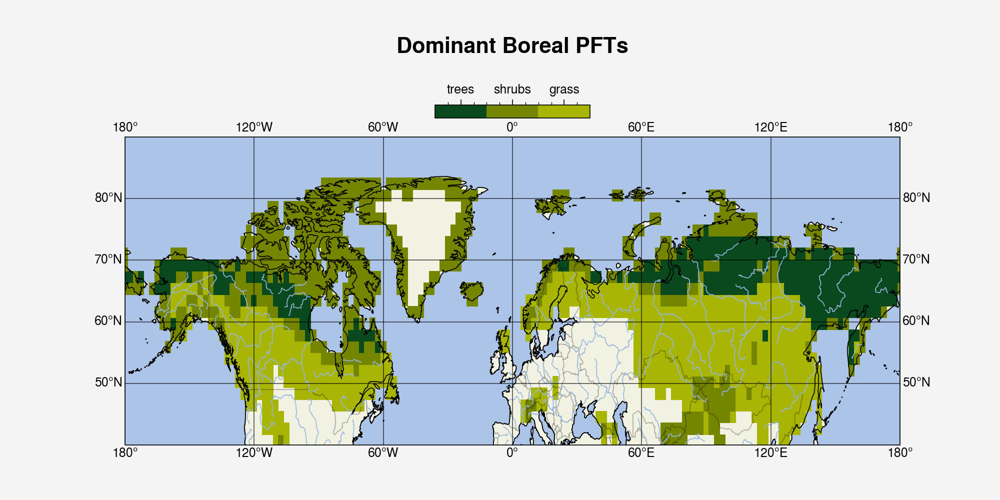

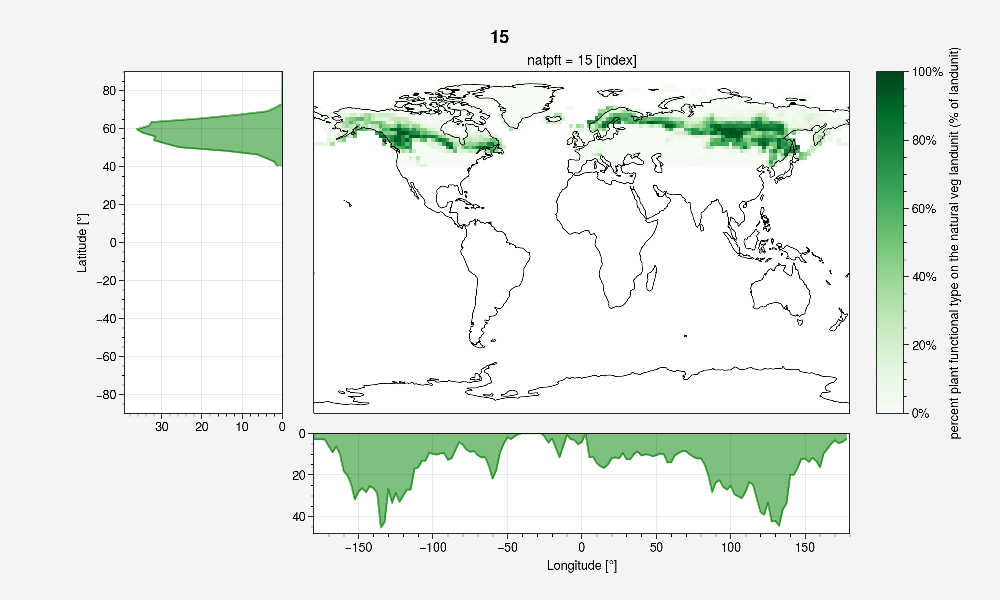

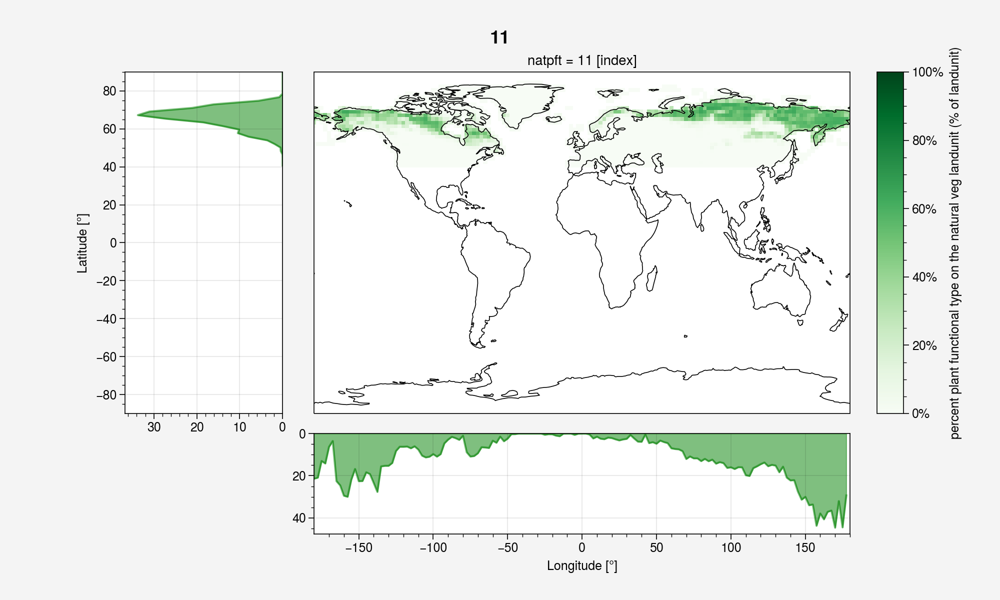

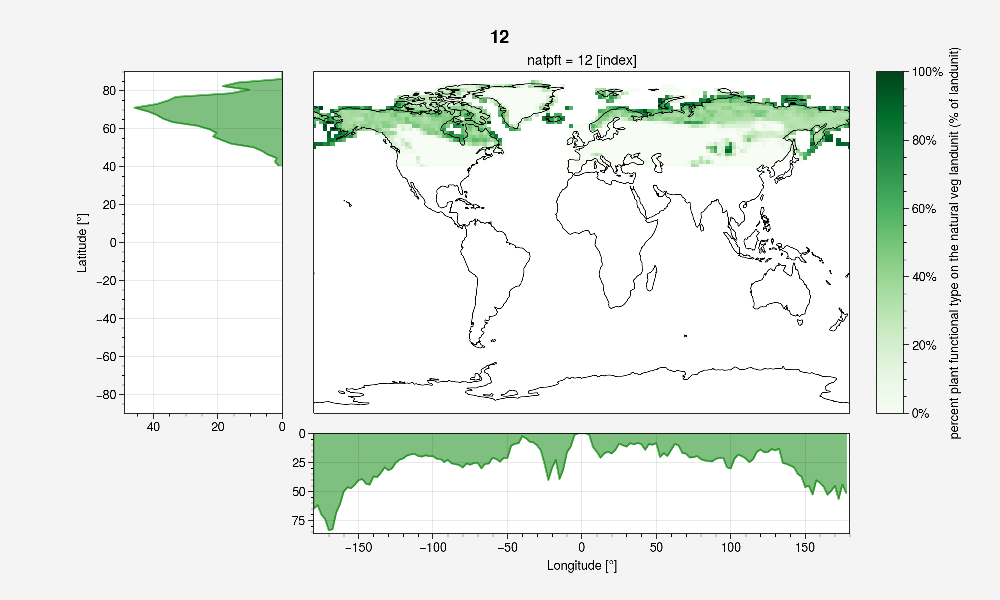

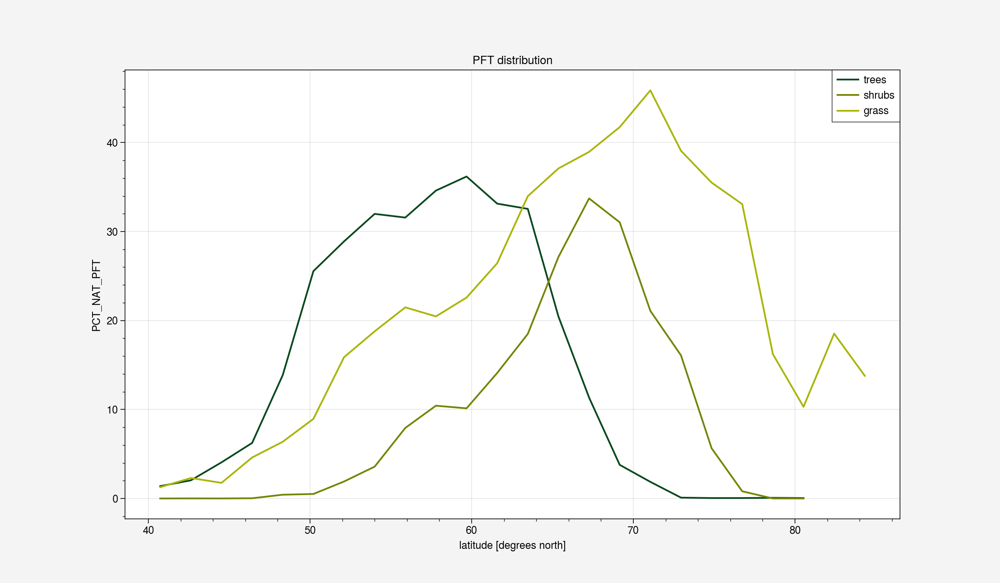

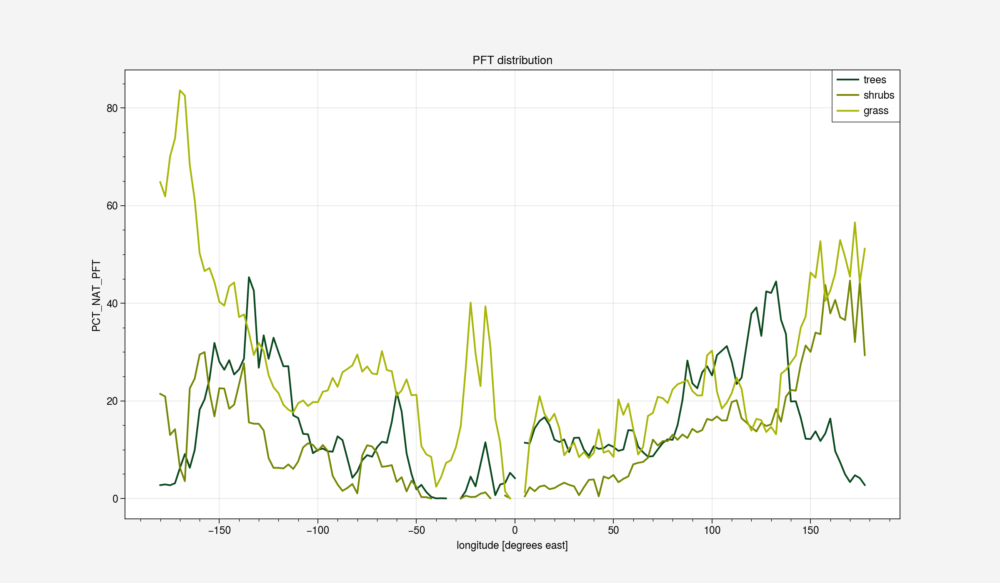

In [37]:
da_pfts = boreal_pfts_macro.where(lnd_frac>0.4)
title = "Dominant Boreal PFTs"
col_dict={15:"pine green",11:"swamp green",12: "mustard green"}
labels = np.array(['trees','shrubs', 'grass'])
proj=ccrs.PlateCarree()#Orthographic(0, 90)
extent = [-180, 180, boreal_lat, 90]

plot_dominant_vegetation(da_pfts, title, col_dict, labels, projection=proj, extent=extent, figsize=[10,5])

for n in boreal_pfts_macro.natpft.values:
    ds = boreal_pfts_macro.sel(natpft=n)#.drop('natpft')
    title = str(n)#+' – '+pft_names[n]
    
    map_lonlatdistribution(ds, lnd_frac, title)

def latitude_plot(da, title):
    da_lat = da.mean('lon')

    fig, ax = plt.subplots(figsize=[12,7])
    for n in da_lat.natpft.values:
        da_lat.where(da_lat>0.).sel(natpft=n).plot(ax=ax,label='natpft - '+str(n), color=col_dict[n])#,col='natpft', col_wrap=5) 
    ax.set_title(title)
    plt.legend(labels,loc='upper right')
    plt.show()
    
def longitude_plot(da, title):
    da_lat = da.mean('lat')

    fig, ax = plt.subplots(figsize=[12,7])
    for n in da_lat.natpft.values:
        da_lat.where(da_lat>0.).sel(natpft=n).plot(ax=ax,label='natpft - '+str(n), color=col_dict[n])#,col='natpft', col_wrap=5) 
    ax.set_title(title)
    plt.legend(labels,loc='upper right')
    plt.show()

latitude_plot(boreal_pfts_macro, "PFT distribution")
longitude_plot(boreal_pfts_macro, "PFT distribution")

In [38]:
def plot_dominant_vegetation(da_pfts, title, col_dict, labels, projection = ccrs.PlateCarree(), extent=None, figsize=[12,8], alpha=0.8):
    """ Plot dominant vegetation on the base on dominant PFT percentage.
        Args:
            - da_pfts (DataArray): PFTs DataArray with dim (lon, lat, natpft)
            - title (string): title of the plot
            - col_dict (dict): keys are PFTs number (int) and values are color names (string)
            - labels (list of string): legend label - PFT names
            - projection (ccrs object): projection of the map. Default: ccrs.PlateCarree()
            - extent (list of float): list of coordinate to zoom on [lon_min, lon_max, lat_min, lat_max]. Default None.
            - alpha (float): opacity of land-ocean background
    """
    
    dominant_boreal = dominant_vegetation(da_pfts)
    #dominant_boreal.plot(); plt.show()

    ############# Preparation for plotting:
    cm, norm, fmt, tickz = discrete_mapping_elements(col_dict, labels)

    ############# Plotting:
    
    fig = plt.figure(1, figsize=figsize)#, dpi=300)
    ax = plt.axes(projection=projection)
    
    if extent:
        if projection == ccrs.PlateCarree():
            ax.set_extent(extent, crs = ccrs.PlateCarree())
        else:
            cut_extent_Orthographic(ax, extent=extent)

    p= dominant_boreal.plot.pcolormesh(ax=ax, x='lon', y='lat', cmap=cm, norm=norm, transform=ccrs.PlateCarree(),
                                    add_colorbar=False)
    cb = fig.colorbar(p, ax=[ax], format=fmt, ticks=tickz, location = 'top', aspect=len(da_pfts.natpft.values)*5, shrink=1/15*len(da_pfts.natpft.values)) 

    ax_map_properties(ax, alpha=alpha)
    ax.gridlines(draw_labels=True)
    ax.set_aspect('auto')

    if projection == ccrs.PlateCarree():
        plt.title(title, y=1.25, size='xx-large', weight='bold')
    else:
        plt.title(title, y=1.15, size='xx-large', weight='bold')
        plt.tight_layout()
    plt.show()

In [39]:
boreal_pfts_macro.isel(lat=10, lon=115)

<xarray.DataArray 'PCT_NAT_PFT' (natpft: 3)>
array([91.2696959 ,  0.66185389,  7.34079566])
Coordinates:
    lat      float64 59.68
    lon      float64 107.5
  * natpft   (natpft) int64 15 11 12
Attributes:
    long_name:  percent plant functional type on the natural veg landunit (% ...
    units:      unitless

### Potential cool plot to understand better the replacement

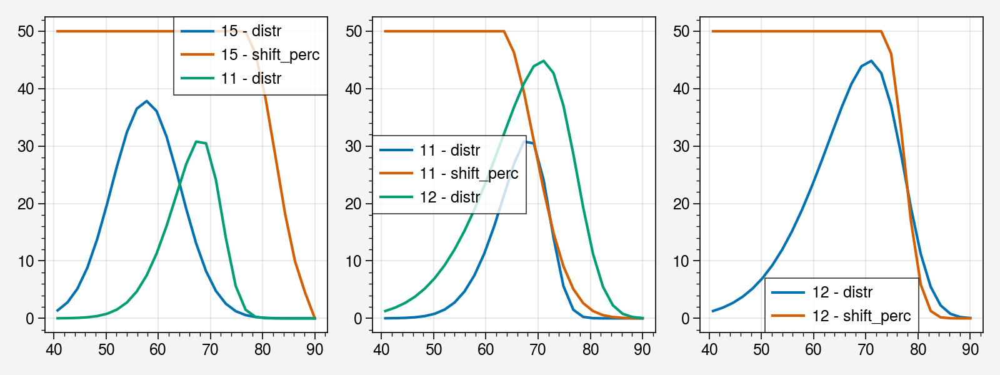

In [40]:
###### HERE NEEDS TO BE CORRECTED #######

fig, axes = plt.subplots(1,3, figsize=[8,3])
bpfts_m = [15, 11, 12]
lat_perc = ds_lat_m.gaussfit.rename('').copy()

for b, ax in enumerate(axes.flat):
    ax.plot(lat_perc.lat, lat_perc.isel(natpft= b), label=str(bpfts_m[b])+" - distr")
    ax.plot(lat_replacem.lat, lat_replacem.isel(natpft= b)*100, label=str(bpfts_m[b])+" - shift_perc")
    if b<2:
        ax.plot(lat_perc.lat, lat_perc.isel(natpft= b+1), label=str(bpfts_m[b+1])+" - distr")
    ax.legend()
        
plt.tight_layout()
plt.show()

NameError: name 'lat_shift_perc' is not defined

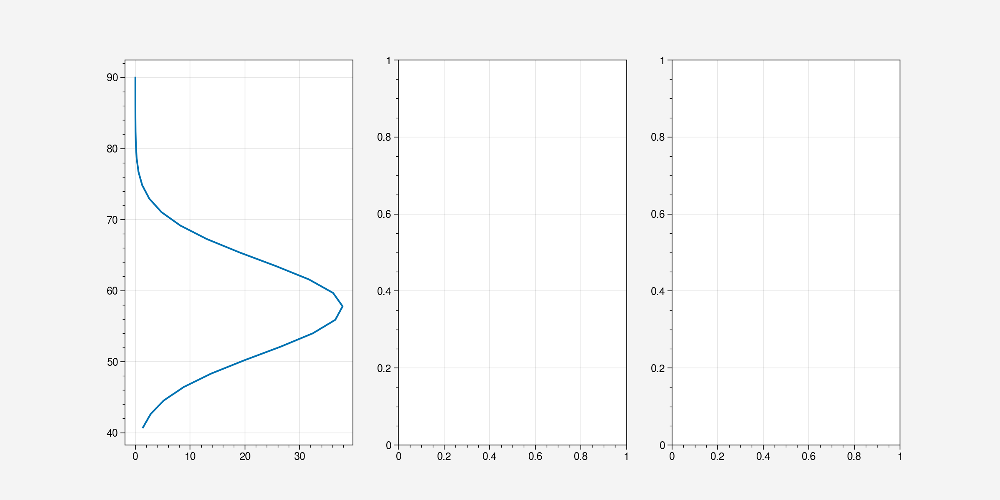

In [41]:
fig, axes = plt.subplots(1,3, figsize=[12,6])

bpfts_m = [15, 11, 12]

lat_perc = ds_lat_m.gaussfit.rename('').copy()

for b, ax in enumerate(axes.flat):
    ax.plot(lat_perc.sel(natpft= bpfts_m[b]),lat_perc.lat)#, label=bpfts_m[b])
    ax.plot(lat_shift_perc.sel(natpft= bpfts_m[b])*100, lat_shift_perc.lat, label=bpfts_m[b])
    if b<2:
        ax.plot(lat_perc.sel(natpft= bpfts_m[b+1]), lat_perc.lat, label=bpfts_m[b+1])

In [ ]:
#plt.stackplot(lat_perc.lat, lat_perc.sel(natpft= bpfts_m[b]))
#plt.stackplot(lat_shift_perc.lat, lat_shift_perc.sel(natpft= bpfts_m[b])*100)

In [ ]:
ax.set_ylim(0,48)
ax.set_yticklabels(['{0:g}%'.format(x) for x in ax.get_yticks()])
ax.set_title('natpft = '+str(bpfts[b]))
if b==3 or b==4:
    ax.set_xlabel('Latitude [°]')
if b==0:
    ax.legend()

In [ ]:
#lat_ax = fig.add_subplot(grid[:-1, 0], sharey=main_ax, ylabel='Latitude [°]') #xticklabels=[],
#df = pfts_lat.sel(natpft=n).drop('natpft').rename('Latitude [°]').to_series().rename_axis('')
#base = plt.gca().transData
#rot = transforms.Affine2D().rotate_deg(90)
#reflect_vertical = transforms.Affine2D(np.array([[1, 0, 0], [0, -1, 0], [0, 0, 1]]))
#df.plot(kind='area', ax=plt.gca(),transform= reflect_vertical + rot + base, stacked=False, color='g',xlim=(0, pfts_lat.sel(natpft=n).max()+3), ylim=(-90,90))
#plt.gca().invert_xaxis() #same as lat_ax.invert_xaxis()

### Several attempts for polyfit with fixed limit values:

In [ ]:
def polynomial_fit(ds, dim, deg=3, fixed_extremes=True):

    def polynomial(x, *p): # p = coefficient vector, len(p)=deg
        p=np.array(p)
        deg=len(p)-1
        V = np.polynomial.polynomial.polyvander(x, deg)
        print(V.shape)
        print(p.shape)
        return np.dot(V,p)
    
    out = ds.polyfit(dim=dim, deg=deg, full=True)
    polyfit = xr.polyval(coord=ds[dim], coeffs=out.polyfit_coefficients).rename('polyfit')
    if fixed_extremes==True:
        sigma = np.ones(len(ds[dim].values))
        sigma[[0, -1]] = 0.01
        names = [f"{name}{i}" for i in range(deg+1) for name in "a"]
        print(names)
        for n in ds.natpft.values:
            fit_params=ds.isel(natpft=n).curvefit(coords=dim, func=polynomial, param_names=names, kwargs={'sigma': sigma})
            display(fit_params)
            popt=fit_params.curvefit_coefficients # NO! .values
            p = polynomial(ds[dim], popt)
            print(p.shape)
            polyfit.where(polyfit != polyfit.isel(natpft=n), polynomial(ds[dim], popt.T))#.drop('param').rename('polyfit')

    #p1, _ = curve_fit(polynomial, ds[dim].values, ds.values, p0=np.zeros(deg+1), sigma=sigma)
    #polyfit.values = polynomial(ds[dim], *p1)

In [ ]:
def polyfit_with_fixed_points(x, y, xf, yf) : #
    assert len(x) == len(y)
    mat = np.empty((n + 1 + len(xf),) * 2)
    vec = np.empty((n + 1 + len(xf),))
    x_n = x**np.arange(2 * n + 1)[:, None]
    yx_n = np.sum(x_n[:n + 1] * y, axis=1)
    x_n = np.sum(x_n, axis=1)
    idx = np.arange(n + 1) + np.arange(n + 1)[:, None]
    mat[:n + 1, :n + 1] = np.take(x_n, idx)
    xf_n = xf**np.arange(n + 1)[:, None]
    mat[:n + 1, n + 1:] = xf_n / 2
    mat[n + 1:, :n + 1] = xf_n.T
    mat[n + 1:, n + 1:] = 0
    vec[:n + 1] = yx_n
    vec[n + 1:] = yf
    params = np.linalg.solve(mat, vec)
    return params[:n + 1]

n, d, f = 50, 8, 3
x = np.random.rand(n)
xf = np.random.rand(f)
poly = np.polynomial.Polynomial(np.random.rand(d + 1))
y = poly(x) + np.random.rand(n) - 0.5
yf = np.random.uniform(np.min(y), np.max(y), size=(f,))
print(f)
print(yf)
params = polyfit_with_fixed_points(x , y, xf, yf)
poly = np.polynomial.Polynomial(params)
xx = np.linspace(0, 1, 1000)
plt.plot(x, y, 'bo')
plt.plot(xf, yf, 'ro')
plt.plot(xx, poly(xx), '-')
plt.show()

In [ ]:
boreal_pfts.plot(col='natpft')

In [ ]:
tree_lon_perc.plot(col='natpft')

In [ ]:
g = edited_macro.broadcast_like(boreal_pfts)
g.plot(col='natpft')

In [ ]:
tree_pfts = [2,3,8]

for t in tree_pfts:
    if t == 2:
        edited_trees = edited_macro.sel(natpft=15).assign_coords({"natpft":t}).expand_dims('natpft')
    else:
        et = edited_macro.sel(natpft=15).assign_coords({"natpft":t}).expand_dims('natpft')
        edited_trees = xr.concat((edited_trees, et), dim='natpft')
                                 
edited_trees.plot(col='natpft')

In [ ]:
edited_boreal_trees = prod_along_dim(edited_trees, 'lon', tree_lon_perc)
edited_boreal_trees.plot(col='natpft')

In [ ]:
btrees = boreal_pfts.isel(natpft=[0,1,2])
btrees.plot(col='natpft')

In [ ]:
a = edited_macro.sel(natpft=15)
b = edited_boreal_trees.sum('natpft')#.plot(); plt.show()
errata_diff = a-b

edited_boreal_trees = edited_boreal_trees.where(edited_boreal_trees.natpft != 2, edited_boreal_trees.sel(natpft=2)+errata_diff)

In [ ]:
edited_boreal_trees.plot(col='natpft')

In [ ]:
wow = xr.concat((edited_boreal_trees, edited_macro), dim='natpft').sel(natpft=[2,3,8,11,12])
wow = wow.assign_attrs(boreal_pfts.attrs)
wow.plot(col='natpft')

In [ ]:
#(edited_boreal_trees.sel(natpft=2)-c.sel(natpft=2)+errata_diff).plot()
#errata_diff = a-edited_boreal_trees.sum('natpft').where(lnd_frac>0.)
#edited_boreal_trees = edited_boreal_trees.where(edited_boreal_trees.natpft != 2, edited_boreal_trees.sel(natpft=2)+errata_diff)

#edited_boreal_trees.where(edited_boreal_trees.natpft==2)
(a-c.sum('natpft')).plot()

In [ ]:
d = (a-c.sum('natpft'))
d.where(d!=0.).dropna('lat', how='all')[0].dropna('lon', how='all')

In [ ]:
print(a.drop('natpft').sel(lat=40.74, lon=77.5, method="nearest"))
print(c.sum('natpft').sel(lat=40.74, lon=77.5, method="nearest"))

In [ ]:
ds = pfts_b_mask.copy()
ds = ds.mean('lon')
ds.plot(col='natpft')
plt.show()
ds = ds.sel(natpft=2)
ds = ds.drop_vars('natpft')
display(ds)
out = ds.polyfit(dim='lat',deg=3)
display(out)
display(np.transpose(out.polyfit_coefficients.values))
a = xr.polyval(ds['lat'],out.polyfit_coefficients)
display(a)
b= ds-a
b.plot()

def detrend_dim(da, dim, deg=1):
    # detrend along a single dimension
    ds=da.copy()
    ds=ds.fillna
    p = da.polyfit(dim=dim, deg=deg, skipna=False)
    fit = xr.polyval(da[dim], p.polyfit_coefficients)
    return da - fit

detrend_dim(ds,'lat',3)

In [ ]:
# Example data
da = xr.DataArray(np.random.randn(20, 180, 360),
                  dims=('time', 'lat', 'lon'),
                  coords={'time': np.linspace(0,19, 20), 
                  'lat': np.linspace(-90,90,180), 
                  'lon': np.linspace(0,359, 360)})

# define a function to compute a linear trend of a timeseries
def linear_trend(x):
    pf = np.polyfit(x.time, x, 1)
    # need to return an xr.DataArray for groupby
    return xr.DataArray(pf[0])

# stack lat and lon into a single dimension called allpoints
stacked = da.stack(allpoints=['lat','lon'])
# apply the function over allpoints to calculate the trend at each point
trend = stacked.groupby('allpoints').apply(linear_trend)
# unstack back to lat lon coordinates
trend_unstacked = trend.unstack('allpoints')

In [ ]:
pfts_b_mask.where(pfts_b_mask>0.).mean('lat').plot.line(x='lon')

## Notes on what I learnt

### Surface

In [ ]:
pfts_b_mask.sel(natpft=12).where(pfts_b_mask.lat>20, drop=True).plot.surface()

In [ ]:
import cartopy.crs as ccrs
import matplotlib.pyplot as plt

import xarray as xr

# Read the data
url = 'https://github.com/mapbox/rasterio/raw/master/tests/data/RGB.byte.tif'
da = xr.open_rasterio(url)

# The data is in UTM projection. We have to set it manually until
# https://github.com/SciTools/cartopy/issues/813 is implemented
crs = ccrs.UTM('18N')

# Plot on a map
ax = plt.subplot(projection=crs)
da.plot.imshow(ax=ax, rgb='band', transform=crs)
ax.coastlines('10m', color='r')
plt.show()

In [ ]:
import cartopy.crs as ccrs

air = xr.tutorial.open_dataset("air_temperature").air

p = air.isel(time=0).plot(subplot_kws=dict(projection=ccrs.Orthographic(-80, 35), facecolor="gray"),transform=ccrs.PlateCarree(),)
p.axes.set_global()
p.axes.coastlines()